In [1]:
# Import all libraries that may be useful for this project
import pandas as pd
import numpy as np
import seaborn as sns
import cmocean as cmo# for nice palette
import matplotlib.pyplot as plt
from matplotlib.figure import Figure
import statsmodels.api as sm
import arviz as az
import pymc as pm
import bambi as bmb
from sklearn.preprocessing import MinMaxScaler
import math
import warnings
warnings.simplefilter(action="ignore")
%matplotlib inline
%config InlineBackend.figure_format="retina"
az.style.use("arviz-doc")
colors={"Mafic":"#008170", "Felsic":"#99B080", "Sedim":"#E7B800"}

In [4]:
#some directories
original="\\\\storage.slu.se\\home_2$\\bebu0001\\Documents\\slu\\3_paper-projects\\nutrient-resorp\\original\\"
processed="\\\\storage.slu.se\\home_2$\\bebu0001\\Documents\\slu\\3_paper-projects\\nutrient-resorp\\processed\\"
analysis="\\\\storage.slu.se\\home_2$\\bebu0001\\Documents\\slu\\3_paper-projects\\nutrient-resorp\\analysis\\"

In [5]:
#load the the data forest inventory and nutrients

nutrient=pd.read_csv('nutrient.csv', encoding='ISO-8859-1', delimiter=';')
tree_inventory=pd.read_csv('tree_inventory.csv', encoding='ISO-8859-1', delimiter=';')
traits_agg=pd.read_excel('traits_agg_mass.xlsx')
nutrient.head()

,plotID,treeID,Species,N,C,CN,N_mass,C_mass,P,NP,CP,K,Mg,Ca,Na,Fe,Al,Mn,Si
0,KBPL1,1008,Neoboutonia Macrocalyx,4.15,50.18,12.09,41500,501800,2196.80,18.891114,228.423161,17685.58,4106.51,8703.87,213.01,75.94,40.75,61.13,407.50
1,KBPL1,1015,Neoboutonia Macrocalyx,3.90,47.73,12.24,39000,477300,3191.47,12.220074,149.554907,16294.75,2954.51,6360.60,147.60,818.29,316.26,142.96,498.60
2,KBPL1,1017,Neoboutonia Macrocalyx,3.61,47.84,13.25,36100,478400,2526.85,14.286562,189.326632,13736.11,3834.16,7767.30,61.63,719.02,420.21,253.99,588.29
3,KBPL1,1023,Allophylus Kivuensis,3.75,48.13,12.84,37500,481300,3455.39,10.852610,139.289632,10526.61,3033.72,5698.03,29.85,848.92,466.44,722.05,615.70
4,KBPL1,1024,Allophylus Kivuensis,4.52,46.49,10.28,45200,464900,3446.51,13.114716,134.890077,28754.37,3510.83,5899.93,37.83,1034.71,389.67,875.82,552.35


In [7]:
# look at the header of the inventory data
tree_inventory.head()

,forest,plotID,treeID,genus,species,famil,meanWD,predHeight18,predHeight20,DBH18,DBH20,TreeBA,BA per Ha,tree_status,comments,name
0,Kahuzi,KBPL1,1001,Neoboutonia,Macrocalyx,Euphorbiaceae,0.330,8.579821,8.823398,11.2,12.77,0.012808,0.080048,1,NaN,Neoboutonia Macrocalyx
1,Kahuzi,KBPL1,1002,Strombosia,Scheffleri,Olacaceae,0.584,7.996669,8.260138,10.2,11.72,0.010788,0.067426,1,NaN,Strombosia Scheffleri
2,Kahuzi,KBPL1,1003,Macaranga,Kilimandsharica,Euphorbiaceae,0.400,8.522882,7.942602,11.1,11.15,0.009764,0.061027,1,NaN,Macaranga Kilimandsharica
3,Kahuzi,KBPL1,1004,Dombeya,Goetzenii,Malvaceae,0.500,19.468882,19.330598,47.5,48.73,0.186502,1.165638,1,NaN,Dombeya Goetzenii
4,Kahuzi,KBPL1,1005,Polyscias,Fulva,Araliaceae,0.237,13.570408,14.662462,22.5,27.61,0.059872,0.374200,1,NaN,Polyscias Fulva


In [8]:
#concatinate genus and species from tree inventory to have on name
tree_inventory['name']=tree_inventory['genus']+' '+tree_inventory['species']
tree_inventory.head()

,forest,plotID,treeID,genus,species,famil,meanWD,predHeight18,predHeight20,DBH18,DBH20,TreeBA,BA per Ha,tree_status,comments,name
0,Kahuzi,KBPL1,1001,Neoboutonia,Macrocalyx,Euphorbiaceae,0.330,8.579821,8.823398,11.2,12.77,0.012808,0.080048,1,NaN,Neoboutonia Macrocalyx
1,Kahuzi,KBPL1,1002,Strombosia,Scheffleri,Olacaceae,0.584,7.996669,8.260138,10.2,11.72,0.010788,0.067426,1,NaN,Strombosia Scheffleri
2,Kahuzi,KBPL1,1003,Macaranga,Kilimandsharica,Euphorbiaceae,0.400,8.522882,7.942602,11.1,11.15,0.009764,0.061027,1,NaN,Macaranga Kilimandsharica
3,Kahuzi,KBPL1,1004,Dombeya,Goetzenii,Malvaceae,0.500,19.468882,19.330598,47.5,48.73,0.186502,1.165638,1,NaN,Dombeya Goetzenii
4,Kahuzi,KBPL1,1005,Polyscias,Fulva,Araliaceae,0.237,13.570408,14.662462,22.5,27.61,0.059872,0.374200,1,NaN,Polyscias Fulva


In [9]:
#drop the existing genus and species variable names
tree_inventory.drop(columns=['genus', 'species', "famil", "comments", "tree_status"], axis=1, inplace=True)
tree_inventory.head()


,forest,plotID,treeID,meanWD,predHeight18,predHeight20,DBH18,DBH20,TreeBA,BA per Ha,name
0,Kahuzi,KBPL1,1001,0.330,8.579821,8.823398,11.2,12.77,0.012808,0.080048,Neoboutonia Macrocalyx
1,Kahuzi,KBPL1,1002,0.584,7.996669,8.260138,10.2,11.72,0.010788,0.067426,Strombosia Scheffleri
2,Kahuzi,KBPL1,1003,0.400,8.522882,7.942602,11.1,11.15,0.009764,0.061027,Macaranga Kilimandsharica
3,Kahuzi,KBPL1,1004,0.500,19.468882,19.330598,47.5,48.73,0.186502,1.165638,Dombeya Goetzenii
4,Kahuzi,KBPL1,1005,0.237,13.570408,14.662462,22.5,27.61,0.059872,0.374200,Polyscias Fulva


In [10]:
# merge nutrient and tree inventory data to have complete dataset

traits=pd.merge(nutrient, tree_inventory,how='inner', on='treeID', suffixes=('_x','_y'))
#traits.to_csv('traits.csv', index=False)
traits.head()

,plotID_x,treeID,Species,N,C,CN,N_mass,C_mass,P,NP,...,forest,plotID_y,meanWD,predHeight18,predHeight20,DBH18,DBH20,TreeBA,BA per Ha,name
0,KBPL1,1008,Neoboutonia Macrocalyx,4.15,50.18,12.09,41500,501800,2196.80,18.891114,...,Kahuzi,KBPL1,0.3300,15.179520,15.739015,27.6,31.46,0.077734,0.485834,Neoboutonia Macrocalyx
1,KBPL1,1015,Neoboutonia Macrocalyx,3.90,47.73,12.24,39000,477300,3191.47,12.220074,...,Kahuzi,KBPL1,0.3300,13.182123,12.678347,21.4,21.59,0.036610,0.228811,Neoboutonia Macrocalyx
2,KBPL1,1017,Neoboutonia Macrocalyx,3.61,47.84,13.25,36100,478400,2526.85,14.286562,...,Kahuzi,KBPL1,0.3300,15.208282,15.142746,27.7,29.27,0.067288,0.420549,Neoboutonia Macrocalyx
3,KBPL1,1023,Allophylus Kivuensis,3.75,48.13,12.84,37500,481300,3455.39,10.852610,...,Kahuzi,KBPL1,0.5178,15.378831,15.204507,28.3,29.49,0.068303,0.426894,Allophylus Kivuensis
4,KBPL1,1024,Allophylus Kivuensis,4.52,46.49,10.28,45200,464900,3446.51,13.114716,...,Kahuzi,KBPL1,0.5178,9.347007,8.791940,12.6,12.71,0.012688,0.079298,Allophylus Kivuensis


In [11]:
#check whether the plotID column is correct for all data
print(traits_agg.shape)
print(traits_agg.plotID.unique())
traits_agg.head()

(34, 20)
['KBPL1' 'KBPL10' 'KBPL11' 'KBPL12' 'KBPL4' 'KBPL5' 'KBPL6' 'KBPL7'
 'KBPL8' 'KBPL9' 'UPL1' 'UPL10' 'UPL11' 'UPL12' 'UPL2' 'UPL3' 'UPL4'
 'UPL5' 'UPL6' 'UPL7' 'UPL8' 'UPL9' 'NPL1' 'NPL10' 'NPL11' 'NPL12' 'NPL2'
 'NPL3' 'NPL4' 'NPL5' 'NPL6' 'NPL7' 'NPL8' 'NPL9']


,plotID,region,slope,N_mass,C_mass,P,CN,NP,CP,K,Mg,Ca,Na,Fe,Al,Mn,Si,meanWD,predHeight18,DBH18
0,KBPL1,Mafic,PL,30.000254,464.316393,2.028663,15.477082,14.788192,228.878067,9.145580,2.615660,10.056992,0.070924,0.710749,0.375557,1.999654,1.173019,0.462915,21.620801,82.588403
1,KBPL10,Mafic,V,33.857574,455.139414,2.926664,13.442765,11.568656,155.514723,17.117632,3.696900,12.319769,0.063301,0.154928,0.089024,0.042561,0.249320,0.391329,17.447864,41.426763
2,KBPL11,Mafic,V,28.049149,462.611250,2.833704,16.492880,9.898405,163.253211,15.504388,3.143740,11.207066,0.038320,0.213851,0.213814,0.084195,0.386352,0.560832,13.134508,23.213780
3,KBPL12,Mafic,V,25.471390,484.933781,1.630316,19.038372,15.623589,297.447695,10.967192,3.007433,6.852107,0.036358,0.193373,0.182028,0.542729,0.377163,0.513624,18.046904,50.686647
4,KBPL4,Mafic,UP,30.970188,468.624280,1.779991,15.131464,17.399067,263.273344,12.740349,3.418260,5.555784,0.032779,0.484450,0.329576,1.589682,0.948677,0.454161,15.376351,31.376731


In [7]:
#check whether geochemistry column is correct for all data

traits_agg.region.unique()

array(['Mafic', 'Felsic', 'Mixed'], dtype=object)

In [12]:
#rename the sedimentary region
traits_agg=traits_agg.replace({"region":{"Mixed":"Sedim"}})
traits_agg.region.unique()

array(['Mafic', 'Felsic', 'Sedim'], dtype=object)

In [13]:
#get the summary statistics for the living leaves nutrient content
from scipy.stats import variation 
print(traits_agg.query('region=="Felsic"')["P"].std()/traits_agg.query('region=="Felsic"')["P"].mean())
print(variation(traits_agg.query('region=="Felsic"')["P"]))

0.3118688683965812
0.2985917086681808


In [14]:
cv = lambda x: np.std(x,ddof=1) / np.mean(x) * 100 
mafic=traits_agg.query('region=="Mafic"')
mafic.iloc[:,3:].apply(cv)

N_mass          12.381852
C_mass           1.786549
P               21.626468
CN              14.486522
NP              18.053302
CP              23.302841
K               34.528494
Mg              26.041959
Ca              25.152869
Na              31.863022
Fe              52.074687
Al              45.460003
Mn              92.771644
Si              72.622674
meanWD          10.945958
predHeight18    18.781084
DBH18           51.129383
dtype: float64

In [15]:
felsic=traits_agg.query('region=="Felsic"')
felsic.iloc[:,3:].apply(cv)

N_mass          11.529190
C_mass           6.702302
P               31.186887
CN              11.170340
NP              30.051110
CP              31.858784
K               24.234749
Mg              25.264625
Ca              18.038553
Na              44.101551
Fe              38.956047
Al              24.023709
Mn              66.014761
Si              28.058205
meanWD           7.715950
predHeight18    16.268666
DBH18           34.775563
dtype: float64

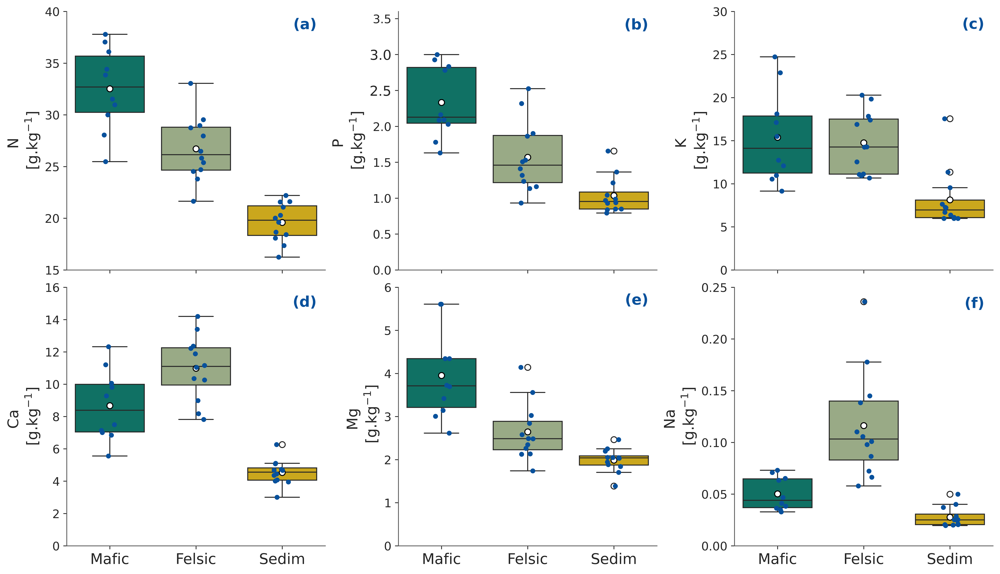

In [37]:
# Visualize canopy nutrient (Living leaves nutrient content)
#from matplotlib.font_manager import _Weight
fig=plt.figure(figsize=[14,8])
plt.subplots_adjust(wspace=0.35, hspace=0.06)
#plotting N concetration in the canopy living leaves
plt.subplot(2,3,1)
colors={"Mafic":"#008170", "Felsic":"#99B080", "Sedim":"#E7B800"}
sns.boxplot(x='region', y='N_mass', data=traits_agg,palette=colors,showmeans=True, meanprops={"marker":"o",
                       "markerfacecolor":"white",
                       "markeredgecolor":"black"})

plt.text(2.4,38.3, "(a)", horizontalalignment='right', size=15, color='#08519c', weight='bold')
# plt.text(0.04,38.5, "a", horizontalalignment='right', size=15, color='black')
# plt.text(1.05,33.9, "b", horizontalalignment='right', size=15, color='black')
# plt.text(2.02,23, "c", horizontalalignment='right', size=15, color='black')
plt.ylim(15,40)

sns.stripplot(x='region',
                            y='N_mass',

                            jitter=True,
                            dodge=True,
                            marker='o',
                            color="#08519c",
                            alpha=1,
                            data=traits_agg)
ax = plt.gca()
ax.axes.xaxis.set_ticklabels("")
plt.ylabel('N \n[g.kg$^{-1}$]',size=15)
plt.xlabel("")
plt.xticks(fontsize=15)
plt.yticks(fontsize=12)
#plotting P concetration in the canopy living leaves
plt.subplot(2,3,2)
sns.boxplot(x='region', y='P', data=traits_agg,palette=colors,showmeans=True, meanprops={"marker":"o",
                       "markerfacecolor":"white",
                       "markeredgecolor":"black"})


plt.text(2.4,3.35, "(b)", horizontalalignment='right', size=15, color='#08519c',weight='bold')
# plt.text(0.04,3.1, "a", horizontalalignment='right', size=15, color='black')
# plt.text(1.05,2.65, "b", horizontalalignment='right', size=15, color='black')
# plt.text(2.02,1.45, "c", horizontalalignment='right', size=15, color='black')
plt.ylim(0,3.6)

sns.stripplot(x='region',
                            y='P',

                            jitter=True,
                            dodge=True,
                            marker='o',
                            color="#08519c",
                            alpha=1,
                            data=traits_agg)
plt.ylabel('P \n[g.kg$^{-1}$]',size=15)
ax = plt.gca()
ax.axes.xaxis.set_ticklabels("")
plt.xlabel("")
plt.yticks(fontsize=12)
plt.xticks(fontsize=15)

#plotting K concetration in the canopy living leaves
plt.subplot(2,3,3)
sns.boxplot(x='region', y='K', data=traits_agg,palette=colors,showmeans=True, meanprops={"marker":"o",
                       "markerfacecolor":"white",
                       "markeredgecolor":"black"})


plt.text(2.4,28, "(c)", horizontalalignment='right', size=15,weight='bold',color='#08519c')
# plt.text(0.04,25.5, "a", horizontalalignment='right', size=15, color='black')
# plt.text(1.04,21, "a", horizontalalignment='right', size=15, color='black')
# plt.text(2.02,10.5, "b", horizontalalignment='right', size=15, color='black')
plt.ylim(0,30)
plt.yticks(fontsize=15)
sns.stripplot(x='region',
                            y='K',

                            jitter=True,
                            dodge=True,
                            marker='o',
                            color="#08519c",
                            alpha=1,
                            data=traits_agg)

ax=plt.gca()
ax.axes.xaxis.set_ticklabels("")
plt.xlabel("")
plt.xlabel("")
plt.yticks(fontsize=12)
plt.xticks(fontsize=15)
plt.ylabel('K \n[g.kg$^{-1}$]',size=15)


#plotting Ca concetration in the canopy living leaves
plt.subplot(2,3,4)

sns.boxplot(x='region', y='Ca', data=traits_agg,palette=colors,showmeans=True, meanprops={"marker":"o",
                       "markerfacecolor":"white",
                       "markeredgecolor":"black"})



plt.text(2.4,14.8, "(d)", horizontalalignment='right', size=15,weight='bold',color='#08519c')
# plt.text(0.04,12.8, "a", horizontalalignment='right', size=15, color='black')
# plt.text(1.04,14.6, "a", horizontalalignment='right', size=15, color='black')
# plt.text(2.02,5.8, "b", horizontalalignment='right', size=15, color='black')
plt.ylim(0,16)
sns.stripplot(x='region',
                            y='Ca',

                            jitter=True,
                            dodge=True,
                            marker='o',
                            color="#08519c",
                            alpha=1,
                            data=traits_agg)
plt.xlabel("")
plt.yticks(fontsize=12)
plt.xticks(fontsize=15)
plt.ylabel('Ca \n[g.kg$^{-1}$]',size=15)

#plotting Mg concetration in the canopy living leaves
plt.subplot(2,3,5)
sns.boxplot(x='region', y='Mg', data=traits_agg,hue="region",palette=colors,showmeans=True, meanprops={"marker":"o",
                       "markerfacecolor":"white",
                       "markeredgecolor":"black"})

plt.text(2.4,5.6, "(e)", horizontalalignment='right', size=15, color='#08519c',weight='bold')
# plt.text(0.04,5.8, "a", horizontalalignment='right', size=15, color='black')
# plt.text(1.04,3.8, "b", horizontalalignment='right', size=15, color='black')
# plt.text(2.02,2.5, "c", horizontalalignment='right', size=15, color='black')
plt.ylim(0,6)

sns.stripplot(x='region',
                            y='Mg',

                            jitter=True,
                            dodge=True,
                            marker='o',
                            color="#08519c",
                            alpha=1,
                            data=traits_agg)
ax=plt.gca()
plt.xlabel("")
plt.yticks(fontsize=12)
plt.xticks(fontsize=15)
plt.ylabel('Mg \n [g.kg$^{-1}$]',size=15)

plt.subplot(2,3,6)
sns.boxplot(x='region', y='Na', data=traits_agg,palette=colors,showmeans=True, meanprops={"marker":"o",
                       "markerfacecolor":"white",
                       "markeredgecolor":"black"})

plt.ylabel("Na \n [g/Kg]", size=15)

plt.text(2.4,0.23, "(f)", horizontalalignment='right', size=15, color='#08519c',weight='bold')
# plt.text(0.04,0.08, "a", horizontalalignment='right', size=15, color='black')
# plt.text(1.04,0.185, "b", horizontalalignment='right', size=15, color='black')
# plt.text(2.02,0.05, "a", horizontalalignment='right', size=15, color='black')
plt.ylim(0,0.25)

sns.stripplot(x='region',
                            y='Na',

                            jitter=True,
                            dodge=True,
                            marker='o',
                            color="#08519c",
                            alpha=1,
                            data=traits_agg)
ax=plt.gca()
plt.xlabel("")
plt.yticks(fontsize=12)
plt.xticks(fontsize=15)

plt.ylabel('Na \n[g.kg$^{-1}$]',size=15);

#fig.savefig('figures/Fig2.png', dpi=600,bbox_inches='tight', pad_inches=0.2);

## Loading litter data and calculating resorption efficiency




In [18]:
#load the litterfall data for the same regions
litter_data=pd.read_excel("230420_PLANT_JEREMY.xlsx")

litter_data.head()

,Solution Label,Al 396.152 nm ppm,Al_mg_kg_dry_weight,Ca 422.673 nm ppm,Ca_mg_kg_dry_weight,Fe 234.350 nm ppm,Fe_mg_kg_dry_weight,K 766.491 nm ppm,K_mg_kg_dry_weight,Mg 285.213 nm ppm,...,Dry_weight_kg,Label_ID,Dilution_Factor,Extraction_volume_l,plotID,BLK_Average_Fe,BLK_average_K,BLK_Average_P,Season,Region
0,Jeremy_1,0.737,589.776933,30.12,24103.23097,0.71,318.095429,8.83,5631.689507,4.66,...,0.000200,J01,4.0,0.04,UPL1,0.3125,1.7925,0.519,WR,UPL
1,Jeremy_2,0.706,572.819473,30.40,24665.31440,0.68,298.174442,10.01,6667.342799,4.11,...,0.000197,J02,4.0,0.04,UPL1,NaN,NaN,NaN,WD,UPL
2,Jeremy_3,0.442,349.925779,26.07,20639.28748,0.43,93.023256,11.78,7906.976744,3.53,...,0.000202,J03,4.0,0.04,UPL1,NaN,NaN,NaN,SR,UPL
3,Jeremy_4,0.690,545.185185,29.03,22937.28395,0.64,258.765432,8.97,5671.111111,3.81,...,0.000202,J04,4.0,0.04,UPL1,NaN,NaN,NaN,SD,UPL
4,Jeremy_5,0.323,249.000241,25.85,19927.72826,0.38,52.035654,7.78,4615.755240,3.64,...,0.000208,J05,4.0,0.04,UPL2,NaN,NaN,NaN,WR,UPL


In [19]:
#subset the litter data to have a smaller size of the data
litter_data=litter_data[['plotID',"Season",'Ca_mg_kg_dry_weight', 'K_mg_kg_dry_weight',
       'Mg_mg_kg_dry_weight',
       'P_mg_kg_dry_weight']]

litter_data.head()

,plotID,Season,Ca_mg_kg_dry_weight,K_mg_kg_dry_weight,Mg_mg_kg_dry_weight,P_mg_kg_dry_weight
0,UPL1,WR,24103.23097,5631.689507,3729.118736,977.093128
1,UPL1,WD,24665.31440,6667.342799,3334.685598,894.117647
2,UPL1,SR,20639.28748,7906.976744,2794.656111,729.935675
3,UPL1,SD,22937.28395,5671.111111,3010.370370,820.938272
4,UPL2,WR,19927.72826,4615.755240,2806.070826,1131.679113


In [21]:
# write a function that converts biomass values to g/kg 

from numpy.ma.extras import isin

numeric_columns=['Ca_mg_kg_dry_weight', 'K_mg_kg_dry_weight',
       'Mg_mg_kg_dry_weight',
       'P_mg_kg_dry_weight']

def convert_cols(df):
  for column in numeric_columns:
    df[column]=df[column]/1000

  return df

# apply the function to the litter dataframe
litter_df=convert_cols(litter_data)

litter_df.head()

,plotID,Season,Ca_mg_kg_dry_weight,K_mg_kg_dry_weight,Mg_mg_kg_dry_weight,P_mg_kg_dry_weight
0,UPL1,WR,24.103231,5.631690,3.729119,0.977093
1,UPL1,WD,24.665314,6.667343,3.334686,0.894118
2,UPL1,SR,20.639287,7.906977,2.794656,0.729936
3,UPL1,SD,22.937284,5.671111,3.010370,0.820938
4,UPL2,WR,19.927728,4.615755,2.806071,1.131679


In [15]:
#check if plotID column is correct in the litter data too
print(litter_df.shape)
print(litter_df.plotID.unique())

(126, 6)
['UPL1' 'UPL2' 'UPL3' 'UPL4' 'UPL5' 'UPL6' 'UPL7' 'UPL8' 'UPL9' 'UPL10'
 'UPL11' 'UPL12' 'IPE_1_4_157_45' 'IPE_2_1_124_46' 'BLK1' 'BLK2' 'KBPL6'
 'KBPL11' 'KBPL12' 'KBPL13' 'KBPL14' 'KBPL15' 'KBPL16' 'NPL1' 'NPL2'
 'NPL3' 'NPL4' 'NPL6' 'NPL7' 'NPL8' 'NPL9' 'NPL10' 'NPL11' 'NPL12'
 'KBPL10']


In [22]:
#remove rows that represents standards. These are note needed for the analysis
list_values=['IPE_1_4_157_45','IPE_2_1_124_46', 'BLK1', 'BLK2']
litter_df=litter_df[litter_df.plotID.isin(list_values)==False]
#check if plotID column is now correct in the litter
print(litter_df.shape)
print(litter_df.plotID.unique())


(118, 6)
['UPL1' 'UPL2' 'UPL3' 'UPL4' 'UPL5' 'UPL6' 'UPL7' 'UPL8' 'UPL9' 'UPL10'
 'UPL11' 'UPL12' 'KBPL6' 'KBPL11' 'KBPL12' 'KBPL13' 'KBPL14' 'KBPL15'
 'KBPL16' 'NPL1' 'NPL2' 'NPL3' 'NPL4' 'NPL6' 'NPL7' 'NPL8' 'NPL9' 'NPL10'
 'NPL11' 'NPL12' 'KBPL10']


In this dataset the plotID will change as follows:

KBPL13>>>>>>KBPL5

KBPL14>>>>>>KBPL1

KBPL15>>>>>>KBPL8

KBPL16>>>>>>KBPL9


This is because some plots in the Congo were relocated due to security concerns

In [ ]:
#rename plotID
# litter_df=litter_df.replace({"plotID":{"KBPL13":"KBPL5","KBPL14":"KBPL1",
#                                        "KBPL15":"KBPL8","KBPL16":"KBPL9"}})

# print(litter_df.plotID.unique())

In [23]:
# look at the data structure

litter_df.head()

,plotID,Season,Ca_mg_kg_dry_weight,K_mg_kg_dry_weight,Mg_mg_kg_dry_weight,P_mg_kg_dry_weight
0,UPL1,WR,24.103231,5.631690,3.729119,0.977093
1,UPL1,WD,24.665314,6.667343,3.334686,0.894118
2,UPL1,SR,20.639287,7.906977,2.794656,0.729936
3,UPL1,SD,22.937284,5.671111,3.010370,0.820938
4,UPL2,WR,19.927728,4.615755,2.806071,1.131679


In [25]:
#load litter fall CN data

litter_cn=pd.read_excel("litter_cn.xlsx")
#drop the season column
litter_cn.head()

,plotID,region,Season,litter_C,litter_N
0,KBPL10,Mafic,SR,42.8,2.2
1,KBPL11,Mafic,WR,43.7,1.8
2,KBPL11,Mafic,WD,43.6,2.0
3,KBPL11,Mafic,SR,43.6,1.6
4,KBPL11,Mafic,SD,43.4,1.9


In [26]:
litter_cn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118 entries, 0 to 117
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   plotID    118 non-null    object 
 1   region    118 non-null    object 
 2   Season    118 non-null    object 
 3   litter_C  118 non-null    float64
 4   litter_N  118 non-null    float64
dtypes: float64(2), object(3)
memory usage: 4.7+ KB


In [27]:
#convert litterfall C an N in g/kg too
litter_cn["litter_C"]=litter_cn["litter_C"]*10
litter_cn["litter_N"]=litter_cn["litter_N"]*10
litter_cn.head()

,plotID,region,Season,litter_C,litter_N
0,KBPL10,Mafic,SR,428.0,22.0
1,KBPL11,Mafic,WR,437.0,18.0
2,KBPL11,Mafic,WD,436.0,20.0
3,KBPL11,Mafic,SR,436.0,16.0
4,KBPL11,Mafic,SD,434.0,19.0


In this dataset the plotID will change as follows:

KBPL13>>>>>>KBPL5

KBPL14>>>>>>KBPL1

KBPL15>>>>>>KBPL8

KBPL16>>>>>>KBPL9


This is because some plots in the Congo were relocated due to security concerns

In [20]:
print(litter_cn.plotID.unique())

['KBPL10' 'KBPL11' 'KBPL12' 'KBPL13' 'KBPL14' 'KBPL15' 'KBPL16' 'KBPL6'
 'NPL1' 'NPL10' 'NPL11' 'NPL12' 'NPL2' 'NPL3' 'NPL4' 'NPL6' 'NPL7' 'NPL8'
 'NPL9' 'UPL1' 'UPL10' 'UPL11' 'UPL12' 'UPL2' 'UPL3' 'UPL4' 'UPL5' 'UPL6'
 'UPL7' 'UPL8' 'UPL9']


In [ ]:
#rename plotID in litter CN data as well
# litter_cn=litter_cn.replace({"plotID":{"KBPL13":"KBPL5","KBPL14":"KBPL1",
#                                        "KBPL15":"KBPL8","KBPL16":"KBPL9"}})

# print(litter_cn.plotID.unique())

In [28]:
#merge liter data and litter CN data
litter_df=litter_df.merge(litter_cn, on=["plotID", "Season"], how="left")

litter_df.head()

,plotID,Season,Ca_mg_kg_dry_weight,K_mg_kg_dry_weight,Mg_mg_kg_dry_weight,P_mg_kg_dry_weight,region,litter_C,litter_N
0,UPL1,WR,24.103231,5.631690,3.729119,0.977093,Felsic,421.0,24.0
1,UPL1,WD,24.665314,6.667343,3.334686,0.894118,Felsic,443.0,23.0
2,UPL1,SR,20.639287,7.906977,2.794656,0.729936,Felsic,419.0,22.0
3,UPL1,SD,22.937284,5.671111,3.010370,0.820938,Felsic,423.0,24.0
4,UPL1,SD,22.937284,5.671111,3.010370,0.820938,Felsic,413.0,23.0


In [24]:
litter_df.shape

(123, 9)

In [29]:
# delete the column season as it is not needed in the analzsis and Verify missing values in the litter data
litter_df=litter_df.drop(columns="Season", axis=1)
litter_df.isna().sum()

plotID                 0
Ca_mg_kg_dry_weight    0
K_mg_kg_dry_weight     0
Mg_mg_kg_dry_weight    0
P_mg_kg_dry_weight     0
region                 6
litter_C               6
litter_N               6
dtype: int64

In [31]:
litter_df_agg=litter_df.groupby(by=["plotID", "region"]).mean().reset_index()
litter_df_agg.head()

,plotID,region,Ca_mg_kg_dry_weight,K_mg_kg_dry_weight,Mg_mg_kg_dry_weight,P_mg_kg_dry_weight,litter_C,litter_N
0,KBPL10,Mafic,17.213000,8.920000,4.113000,2.233000,428.00,22.00
1,KBPL11,Mafic,18.272905,7.237891,4.011445,1.622903,435.75,18.25
2,KBPL12,Mafic,16.684012,3.713351,7.018714,1.946526,443.75,19.50
3,KBPL13,Mafic,14.611741,3.148967,7.131015,1.636399,431.00,20.50
4,KBPL14,Mafic,14.480983,2.560095,7.432306,1.399055,439.25,26.00


In [37]:
#Verify missing values in the litter data again
print(litter_df_agg.shape)
litter_df_agg.isna().sum()

(31, 8)


plotID                 0
region                 0
Ca_mg_kg_dry_weight    0
K_mg_kg_dry_weight     0
Mg_mg_kg_dry_weight    0
P_mg_kg_dry_weight     0
litter_C               0
litter_N               0
dtype: int64

In [33]:
print(litter_df_agg.plotID.unique())
print(traits_agg.plotID.unique())

['KBPL10' 'KBPL11' 'KBPL12' 'KBPL13' 'KBPL14' 'KBPL15' 'KBPL16' 'KBPL6'
 'NPL1' 'NPL10' 'NPL11' 'NPL12' 'NPL2' 'NPL3' 'NPL4' 'NPL6' 'NPL7' 'NPL8'
 'NPL9' 'UPL1' 'UPL10' 'UPL11' 'UPL12' 'UPL2' 'UPL3' 'UPL4' 'UPL5' 'UPL6'
 'UPL7' 'UPL8' 'UPL9']
['KBPL1' 'KBPL10' 'KBPL11' 'KBPL12' 'KBPL4' 'KBPL5' 'KBPL6' 'KBPL7'
 'KBPL8' 'KBPL9' 'UPL1' 'UPL10' 'UPL11' 'UPL12' 'UPL2' 'UPL3' 'UPL4'
 'UPL5' 'UPL6' 'UPL7' 'UPL8' 'UPL9' 'NPL1' 'NPL10' 'NPL11' 'NPL12' 'NPL2'
 'NPL3' 'NPL4' 'NPL5' 'NPL6' 'NPL7' 'NPL8' 'NPL9']


In [47]:
#merge the litter data and fresh leaves
litter_fresh_df_agg=litter_df_agg.merge(traits_agg[["plotID","N_mass","C_mass","P","K","CN","NP","Mg","Ca"]], on="plotID", how="inner")
print(litter_fresh_df_agg.shape)
litter_fresh_df_agg.head()

(27, 16)


,plotID,region,Ca_mg_kg_dry_weight,K_mg_kg_dry_weight,Mg_mg_kg_dry_weight,P_mg_kg_dry_weight,litter_C,litter_N,N_mass,C_mass,P,K,CN,NP,Mg,Ca
0,KBPL10,Mafic,17.213000,8.920000,4.113000,2.233000,428.000000,22.000000,33.857574,455.139414,2.926664,17.117632,13.442765,11.568656,3.696900,12.319769
1,KBPL11,Mafic,18.272905,7.237891,4.011445,1.622903,435.750000,18.250000,28.049149,462.611250,2.833704,15.504388,16.492880,9.898405,3.143740,11.207066
2,KBPL12,Mafic,16.684012,3.713351,7.018714,1.946526,443.750000,19.500000,25.471390,484.933781,1.630316,10.967192,19.038372,15.623589,3.007433,6.852107
3,KBPL6,Mafic,18.634068,4.807062,5.470394,1.727377,436.000000,25.333333,31.531142,456.493925,2.161889,10.539101,14.477558,14.584993,5.608900,9.281973
4,NPL1,Sedimentary,5.459219,0.782710,1.338704,0.187631,470.571429,17.285714,18.656642,493.595290,0.986371,7.222998,26.456813,18.914429,2.195004,6.263890


In [33]:
litter_fresh_df_agg.plotID.unique()

array(['KBPL10', 'KBPL11', 'KBPL12', 'KBPL6', 'NPL1', 'NPL10', 'NPL11',
       'NPL12', 'NPL2', 'NPL3', 'NPL4', 'NPL6', 'NPL7', 'NPL8', 'NPL9',
       'UPL1', 'UPL10', 'UPL11', 'UPL12', 'UPL2', 'UPL3', 'UPL4', 'UPL5',
       'UPL6', 'UPL7', 'UPL8', 'UPL9'], dtype=object)

In [ ]:
n_litter=litter_fresh_df_agg["litter_N"]/1000


In [49]:
#correct the values of N, K and P using the value Ca as a tracer a lement
litter_fresh_df_agg["tracer"]=litter_fresh_df_agg["Ca"]/litter_fresh_df_agg["Ca_mg_kg_dry_weight"]
litter_fresh_df_agg["lit_N_adj"]=litter_fresh_df_agg["litter_N"]*litter_fresh_df_agg["tracer"]
litter_fresh_df_agg["lit_K_adj"]=litter_fresh_df_agg["K_mg_kg_dry_weight"]*litter_fresh_df_agg["tracer"]
litter_fresh_df_agg["lit_P_adj"]=litter_fresh_df_agg["P_mg_kg_dry_weight"]*litter_fresh_df_agg["tracer"]
litter_fresh_df_agg["lit_Mg_adj"]=litter_fresh_df_agg["Mg_mg_kg_dry_weight"]*litter_fresh_df_agg["tracer"]


In [50]:
# calaculate the resorption efficiency rate
litter_fresh_df_agg["N_resorp"]=(litter_fresh_df_agg["N_mass"]-litter_fresh_df_agg["lit_N_adj"])*100/litter_fresh_df_agg["N_mass"]
litter_fresh_df_agg["K_resorp"]=(litter_fresh_df_agg["K"]-litter_fresh_df_agg["lit_K_adj"])*100/litter_fresh_df_agg["K"]
litter_fresh_df_agg["P_resorp"]=(litter_fresh_df_agg["P"]-litter_fresh_df_agg["lit_P_adj"])*100/litter_fresh_df_agg["P"]
litter_fresh_df_agg["Mg_resorp"]=(litter_fresh_df_agg["Mg"]-litter_fresh_df_agg["lit_Mg_adj"])*100/litter_fresh_df_agg["Mg"]
litter_fresh_df_agg.head()

,plotID,region,Ca_mg_kg_dry_weight,K_mg_kg_dry_weight,Mg_mg_kg_dry_weight,P_mg_kg_dry_weight,litter_C,litter_N,N_mass,C_mass,...,lit_Mg_adj,N_resorp,K_resorp,P_resorp,Mg_resorp,NP_resorp,NK_resorp,NMg_resorp,lit_N_adj2,N_resorp2
0,KBPL10,Mafic,17.213000,8.920000,4.113000,2.233000,428.000000,22.000000,33.857574,455.139414,...,2.943776,53.493589,62.703580,45.391308,20.371786,1.178499,0.853119,2.625866,0.022000,3383.557430
1,KBPL11,Mafic,18.272905,7.237891,4.011445,1.622903,435.750000,18.250000,28.049149,462.611250,...,2.460283,60.094982,71.368655,64.874511,21.740237,0.926327,0.842036,2.764228,0.018250,2803.089882
2,KBPL12,Mafic,16.684012,3.713351,7.018714,1.946526,443.750000,19.500000,25.471390,484.933781,...,2.882579,68.558330,86.094258,50.964346,4.151535,1.345221,0.796317,16.513970,0.019500,2545.188963
3,KBPL6,Mafic,18.634068,4.807062,5.470394,1.727377,436.000000,25.333333,31.531142,456.493925,...,2.724904,59.979246,77.279978,60.199699,51.418205,0.996338,0.776129,1.166498,0.025333,3150.580858
4,NPL1,Sedim,5.459219,0.782710,1.338704,0.187631,470.571429,17.285714,18.656642,493.595290,...,1.536024,-6.308370,87.566394,78.173771,30.021796,-0.080697,-0.072041,-0.210126,0.017286,1863.935634


In [ ]:
#replace zeros to avoid vdivision with zero which resulted in infinity
# litter_fresh_df_agg=litter_fresh_df_agg.replace([np.inf, -np.inf],0)
#litter_fresh_df_agg.query('region=="Sedimentary"')

In [53]:
# calculate the ratio of nitrogen resorption to Phosphorus resorption 
litter_fresh_df_agg["NP_resorp"]=litter_fresh_df_agg["N_resorp"]/litter_fresh_df_agg["P_resorp"]
litter_fresh_df_agg["NK_resorp"]=litter_fresh_df_agg["N_resorp"]/litter_fresh_df_agg["K_resorp"]
litter_fresh_df_agg["NMg_resorp"]=litter_fresh_df_agg["N_resorp"]/litter_fresh_df_agg["Mg_resorp"]
litter_fresh_df_agg.head()

,plotID,region,Ca_mg_kg_dry_weight,K_mg_kg_dry_weight,Mg_mg_kg_dry_weight,P_mg_kg_dry_weight,litter_C,litter_N,N_mass,C_mass,...,lit_K_adj,lit_P_adj,lit_Mg_adj,N_resorp,K_resorp,P_resorp,Mg_resorp,NP_resorp,NK_resorp,NMg_resorp
0,KBPL10,Mafic,17.213000,8.920000,4.113000,2.233000,428.000000,22.000000,33.857574,455.139414,...,6.384264,1.598213,2.943776,53.493589,62.703580,45.391308,20.371786,1.178499,0.853119,2.625866
1,KBPL11,Mafic,18.272905,7.237891,4.011445,1.622903,435.750000,18.250000,28.049149,462.611250,...,4.439115,0.995352,2.460283,60.094982,71.368655,64.874511,21.740237,0.926327,0.842036,2.764228
2,KBPL12,Mafic,16.684012,3.713351,7.018714,1.946526,443.750000,19.500000,25.471390,484.933781,...,1.525069,0.799436,2.882579,68.558330,86.094258,50.964346,4.151535,1.345221,0.796317,16.513970
3,KBPL6,Mafic,18.634068,4.807062,5.470394,1.727377,436.000000,25.333333,31.531142,456.493925,...,2.394486,0.860438,2.724904,59.979246,77.279978,60.199699,51.418205,0.996338,0.776129,1.166498
4,NPL1,Sedimentary,5.459219,0.782710,1.338704,0.187631,470.571429,17.285714,18.656642,493.595290,...,0.898079,0.215288,1.536024,-6.308370,87.566394,78.173771,30.021796,-0.080697,-0.072041,-0.210126


In [51]:
# rename the seimentaryu region to sedim:

litter_fresh_df_agg=litter_fresh_df_agg.replace({"region":{"Sedimentary":"Sedim"}})
litter_fresh_df_agg.region.unique()

array(['Mafic', 'Sedim', 'Felsic'], dtype=object)

In [68]:
#save cleaned data:litter, living leaves and resorption rate data
litter_fresh_df_agg.to_csv("processed/litter_fresh_df_agg.csv", index=False)

In [30]:
#Read cleaned data:litter, living leaves and resorption rate data
litter_fresh_df_agg=pd.read_csv("\\\\storage.slu.se\\home_2$\\bebu0001\\Documents\\slu\\3_paper-projects\\nutrient-resorp\\processed\\litter_fresh_df_agg.csv")
litter_fresh_df_agg.head()

,plotID,region,Ca_mg_kg_dry_weight,K_mg_kg_dry_weight,Mg_mg_kg_dry_weight,P_mg_kg_dry_weight,litter_C,litter_N,N_mass,C_mass,...,lit_K_adj,lit_P_adj,lit_Mg_adj,N_resorp,K_resorp,P_resorp,Mg_resorp,NP_resorp,NK_resorp,NMg_resorp
0,KBPL10,Mafic,17.213000,8.920000,4.113000,2.233000,428.000000,22.000000,33.857574,455.139414,...,6.384264,1.598213,2.943776,53.493589,62.703580,45.391308,20.371786,1.178499,0.853119,2.625866
1,KBPL11,Mafic,18.272905,7.237891,4.011445,1.622903,435.750000,18.250000,28.049149,462.611250,...,4.439115,0.995352,2.460283,60.094982,71.368655,64.874511,21.740237,0.926327,0.842036,2.764228
2,KBPL12,Mafic,16.684012,3.713351,7.018714,1.946526,443.750000,19.500000,25.471390,484.933781,...,1.525069,0.799436,2.882579,68.558330,86.094258,50.964346,4.151535,1.345221,0.796317,16.513970
3,KBPL6,Mafic,18.634068,4.807062,5.470394,1.727377,436.000000,25.333333,31.531142,456.493925,...,2.394486,0.860438,2.724904,59.979246,77.279978,60.199699,51.418205,0.996338,0.776129,1.166498
4,NPL1,Sedim,5.459219,0.782710,1.338704,0.187631,470.571429,17.285714,18.656642,493.595290,...,0.898079,0.215288,1.536024,-6.308370,87.566394,78.173771,30.021796,-0.080697,-0.072041,-0.210126


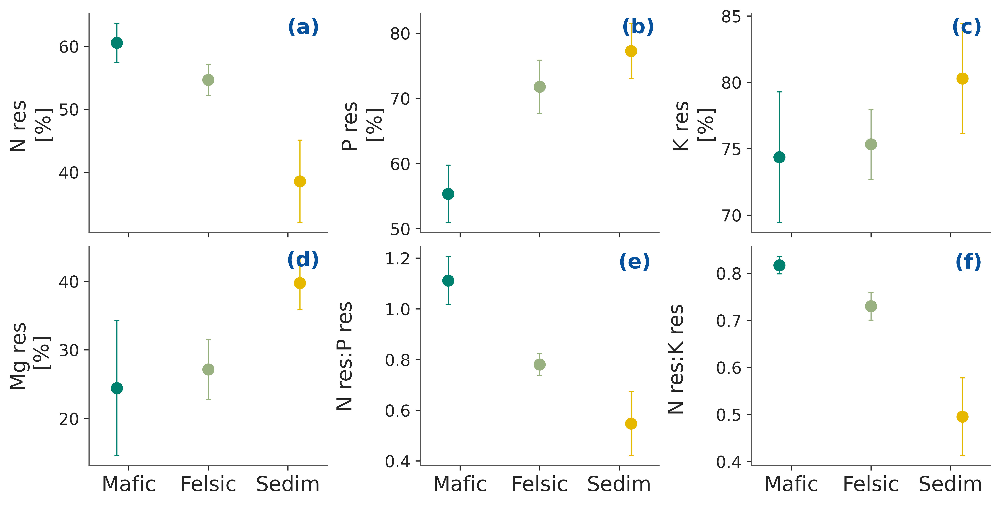

In [38]:
#create point plots
fig=plt.figure(figsize=[10,5])
plt.subplots_adjust(wspace=0.5, hspace=0.06)

plt.subplot(2,3,1)

sns.pointplot(x="region",y='N_resorp',estimator="mean",errorbar="se", capsize=.05, linestyles="", dodge=0.3,
errwidth=0.8,palette=colors,data=litter_fresh_df_agg,order=colors)
plt.xlabel("")
plt.ylabel('N res \n[%]',size=15)
plt.yticks(fontsize=12)
#plt.legend(loc="upper left")
ax=plt.gca()
ax.axes.xaxis.set_ticklabels("")
plt.text(2.4,62, "(a)", horizontalalignment='right', size=15, color='#08519c',weight='bold')

plt.subplot(2,3,2)
sns.pointplot(x="region",y='P_resorp',estimator="mean",errorbar="se", capsize=.05, linestyles="", dodge=0.3,
errwidth=0.8,palette=colors,data=litter_fresh_df_agg,order=colors)
plt.xlabel("")
plt.ylabel('P res \n[%]',size=15)
plt.yticks(fontsize=12)
ax=plt.gca()
ax.axes.xaxis.set_ticklabels("")
plt.text(2.45,80, "(b)", horizontalalignment='right', size=15, color='#08519c',weight='bold')

plt.subplot(2,3,3)
sns.pointplot(x="region",y='K_resorp',estimator="mean",errorbar="se", capsize=.05, linestyles="", dodge=0.3,
errwidth=0.8,order=colors,palette=colors,data=litter_fresh_df_agg)
plt.xlabel("")
plt.ylabel('K res \n[%]',size=15)
plt.yticks(fontsize=12)
ax=plt.gca()
ax.axes.xaxis.set_ticklabels("")
plt.text(2.4,83.7, "(c)", horizontalalignment='right', size=15, color='#08519c',weight='bold')

plt.subplot(2,3,4)

sns.pointplot(x="region",y='Mg_resorp',estimator="mean",errorbar="se", capsize=.05, linestyles="", dodge=0.3,
errwidth=0.8,palette=colors,data=litter_fresh_df_agg,order=colors)
plt.xlabel("")
plt.ylabel('Mg res\n [%]',size=15)
plt.yticks(fontsize=12)
plt.xticks(fontsize=15)
plt.text(2.4,42.2, "(d)", horizontalalignment='right', size=15, color='#08519c',weight='bold')
# ax=plt.gca()
# ax.axes.xaxis.set_ticklabels("")


plt.subplot(2,3,5)
sns.pointplot(x="region",y='NP_resorp',estimator="mean",errorbar="se", capsize=.05, linestyles="", dodge=0.3,
errwidth=0.8,palette=colors,data=litter_fresh_df_agg,order=colors)
plt.xlabel("")
plt.ylabel('N res:P res\n',size=15)
plt.yticks(fontsize=12)
plt.xticks(fontsize=15)

plt.text(2.4,1.16, "(e)", horizontalalignment='right', size=15, color='#08519c',weight='bold')
#ax=plt.gca()
#ax.axes.xaxis.set_ticklabels("")


plt.subplot(2,3,6)
sns.pointplot(x="region",y='NK_resorp',estimator="mean",errorbar="se",capsize=.05, linestyles="", dodge=0.3,errwidth=0.8
,palette=colors,data=litter_fresh_df_agg,order=colors)
plt.ylabel('N res:K res \n',size=15)
plt.yticks(fontsize=12)
plt.xticks(fontsize=15)

plt.text(2.4,0.81, "(f)", horizontalalignment='right', size=15, color='#08519c',weight='bold')
plt.xlabel("");
#fig.savefig('figures/Fig4.png', dpi=600,bbox_inches='tight', pad_inches=0.15);


In [76]:
#merging CN data for both litterfall and fresh leaves

litter_cn["CN"]=litter_cn["litter_C"]/litter_cn["litter_N"]
litter_cn["type"]="Litter fall"
traits_agg["type"]="Living leaves"
litter_cn.head()
#concatinate the two dataframe
cn_data=pd.concat([litter_cn[["plotID","region","CN","type"]],traits_agg[["plotID","region","CN","type"]]])
#rename regions
cn_data=cn_data.replace({"region":{"Mixed":"Sedim"}})
print(cn_data.shape)
cn_data.head()

(152, 4)


,plotID,region,CN,type
0,KBPL10,Mafic,19.454545,Litter fall
1,KBPL11,Mafic,24.277778,Litter fall
2,KBPL11,Mafic,21.800000,Litter fall
3,KBPL11,Mafic,27.250000,Litter fall
4,KBPL11,Mafic,22.842105,Litter fall


In [64]:
#load the litter layer

# df_litter_layer=pd.read_excel("c:/Users/bebu0001/slu/paper-projects/eco-analysis/original/litter_layer_cn.xlsx")
# df_litter_layer["type"]="Litter layer"
# df_litter_layer.head()

,plotID,region,sampleID,Litter_n,litteter_c,CN,type
0,KBPL10,Mafic,KBPL10PL,2.509290,39.437630,15.716650,Litter layer
1,KBPL11,Mafic,KBPL11L,2.997642,41.174469,13.735618,Litter layer
2,KBPL1,Mafic,KBPL1L,2.576051,41.210064,15.997376,Litter layer
3,KBPL12,Mafic,KBPL12,2.753466,40.306049,14.726134,Litter layer
4,KBPL2,Mafic,KBPL2CompL,1.939930,45.299126,23.350906,Litter layer


In [ ]:
#concatinate all cn dataframes
# all_cn_data=pd.concat([df_litter_layer[["plotID","region","CN","type"]],df_O_layer_cn[["plotID","region","CN","type"]], cn_data])
# print(all_cn_data.type.unique())
# all_cn_data.head()

['Litter layer' 'O-horizon' 'Litter fall' 'Living leaves']


,plotID,region,CN,type
0,KBPL10,Mafic,15.71665,Litter layer
1,KBPL11,Mafic,13.735618,Litter layer
2,KBPL1,Mafic,15.997376,Litter layer
3,KBPL12,Mafic,14.726134,Litter layer
4,KBPL2,Mafic,23.350906,Litter layer


In [ ]:
# all_cn_data["CN"]=all_cn_data["CN"].astype("float")
# all_cn_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 227 entries, 0 to 33
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   plotID  227 non-null    object 
 1   region  227 non-null    object 
 2   CN      227 non-null    float64
 3   type    227 non-null    object 
dtypes: float64(1), object(3)
memory usage: 8.9+ KB


In [ ]:
#export all CN data
#all_cn_data.to_csv("all_cn_data.csv", index=False)

In [16]:
#load the preprocessed data
all_cn_data=pd.read_csv("all_cn_data.csv")
#load soil data and sample ids
sample_id=pd.read_excel("sample_id.xlsx")
soil_10=pd.read_excel("soil_phy_chem.xlsx" )
CN_soil=pd.read_excel("soil_carbon.xlsx" )

soil_10=pd.merge(soil_10, sample_id, how='inner',on='sampleID', suffixes=("_x","_y"))
#add the soil CN data
soil_10=pd.merge(soil_10, CN_soil, how='inner',on='sampleID')

soil_10.head()

,sampleID,clay,silt,sand,BD_m_soil,WHC,pH_KCl,P_avail,exch_acidity_Al,exch_acidity_H,...,no_Mn_ox_extract,mean_Mn_dcb_extract,sd_Mn_dcb_extract,no_Mn_dcb_extract,plotID,depth,depth_int,region,N,C
0,KBPL10C1,46.88,14.00,39.12,0.822,0.44,5.40,32.78,0.0,0.758,...,1,0.07340,-9999.0,1,KBPL10,C1,10cm,Mafic,0.95088,8.58088
1,KBPL11C1,27.60,10.00,62.40,0.654,0.46,4.35,35.25,0.0,1.900,...,-9999,-9999.00000,-9999.0,-9999,KBPL11,C1,10cm,Mafic,0.72923,7.53175
2,KBPL12C1,24.88,12.00,63.12,0.687,0.45,3.60,33.76,4.8,0.509,...,-9999,-9999.00000,-9999.0,-9999,KBPL12,C1,10cm,Mafic,0.93539,9.74146
3,KBPL1C1,61.60,19.28,19.12,0.768,0.62,3.27,37.70,6.0,0.446,...,1,0.07555,-9999.0,1,KBPL1,C1,10cm,Mafic,0.49309,4.73554
4,KBPL2C1,51.60,9.28,39.12,0.768,0.81,3.32,52.61,7.2,1.142,...,-9999,-9999.00000,-9999.0,-9999,KBPL2,C1,10cm,Mafic,0.86402,11.14913


In [3]:
soil_10=soil_10.query('depth=="C1"')
variables=["plotID","region","pH_KCl","ECEC","P_avail","exch_bases_K","exch_bases_Ca","exch_bases_Mg","exch_bases_Na","N", "C",
           "mean_P_bulk_ICPOES","mean_K_bulk_ICPOES","mean_Ca_bulk_OES","mean_Mg_bulk_ICPOES","mean_Na_bulk_ICPOES"]


# Keep columns defined in the list varibles
soil_10=soil_10[variables]


#rename the columns of soil properties for top 10 cm
soil_10=soil_10.rename(columns={"C":"Total_C","N":"Total_N","exch_bases_Na":"Na_ex","exch_bases_K":"K_ex","exch_bases_Ca":"Ca_ex","exch_bases_Mg":"Mg_ex",
                                "mean_Ca_bulk_OES":"Total_Ca", "mean_K_bulk_ICPOES":"Total_K","mean_Mg_bulk_ICPOES":"Total_Mg",
                                "mean_P_bulk_ICPOES":"Total_P","mean_Na_bulk_ICPOES":"Total_Na"})

soil_10.head()

,plotID,region,pH_KCl,ECEC,P_avail,K_ex,Ca_ex,Mg_ex,Na_ex,Total_N,Total_C,Total_P,Total_K,Total_Ca,Total_Mg,Total_Na
0,KBPL10,Mafic,5.40,33.206,32.78,0.793,24.251,7.359,0.043,0.95088,8.58088,0.218462,0.138750,0.796442,0.367500,0.043942
1,KBPL11,Mafic,4.35,15.772,35.25,1.279,8.972,3.578,0.043,0.72923,7.53175,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000
2,KBPL12,Mafic,3.60,9.991,33.76,0.332,2.904,1.405,0.040,0.93539,9.74146,0.160000,0.088235,0.087402,0.180588,0.015637
3,KBPL1,Mafic,3.27,8.844,37.70,0.281,1.667,0.449,0.000,0.49309,4.73554,0.144700,0.086600,0.022400,0.198500,0.019250
4,KBPL2,Mafic,3.32,10.596,52.61,0.332,1.417,0.504,0.000,0.86402,11.14913,0.167157,0.091996,0.038776,0.192732,0.023091


In [4]:
soil_10.to_csv("\\\\storage.slu.se\\home_2$\\bebu0001\\Documents\\slu\\3_paper-projects\\nutrient-resorp\\processed\\top_soil.csv", index=False)

In [118]:
#replace all values under detection limit with zero
soil_10=soil_10.replace({-9999.000000:0.1})
soil_10.head()

,plotID,region,pH_KCl,ECEC,P_avail,K_ex,Ca_ex,Mg_ex,Na_ex,Total_N,Total_C,Total_P,Total_K,Total_Ca,Total_Mg,Total_Na
0,KBPL10,Mafic,5.40,33.206,32.78,0.793,24.251,7.359,0.043,0.95088,8.58088,0.218462,0.138750,0.796442,0.367500,0.043942
1,KBPL11,Mafic,4.35,15.772,35.25,1.279,8.972,3.578,0.043,0.72923,7.53175,0.100000,0.100000,0.100000,0.100000,0.100000
2,KBPL12,Mafic,3.60,9.991,33.76,0.332,2.904,1.405,0.040,0.93539,9.74146,0.160000,0.088235,0.087402,0.180588,0.015637
3,KBPL1,Mafic,3.27,8.844,37.70,0.281,1.667,0.449,0.000,0.49309,4.73554,0.144700,0.086600,0.022400,0.198500,0.019250
4,KBPL2,Mafic,3.32,10.596,52.61,0.332,1.417,0.504,0.000,0.86402,11.14913,0.167157,0.091996,0.038776,0.192732,0.023091


In [21]:
#read the soil data
soil_top=pd.read_csv(processed+"top_soil.csv")
soil_top.head()

,plotID,region,pH_KCl,ECEC,P_avail,K_ex,Ca_ex,Mg_ex,Total_N,Total_C,Total_Ca,Total_K,Total_Mg,Total_P
0,KBPL10,Mafic,5.40,33.206,32.78,0.793,24.251,7.359,0.95088,8.58088,0.42266,0.16286,0.42926,0.180825
1,KBPL11,Mafic,4.35,15.772,35.25,1.279,8.972,3.578,0.72923,7.53175,0.33537,0.15339,0.47645,0.334981
2,KBPL12,Mafic,3.60,9.991,33.76,0.332,2.904,1.405,0.93539,9.74146,0.18913,0.11838,0.33763,0.274479
3,KBPL1,Mafic,3.27,8.844,37.70,0.281,1.667,0.449,0.49309,4.73554,0.07873,0.06096,0.19465,0.103378
4,KBPL2,Mafic,3.32,10.596,52.61,0.332,1.417,0.504,0.86402,11.14913,0.00824,0.04703,0.20246,0.174350


In [8]:
soil_top.region.unique()

array(['Mafic', 'Sedim', 'Felsic'], dtype=object)

In [17]:
#rename sedimentary to Sedim in this data
all_cn_data=all_cn_data.replace({"region":{"Sedimentary":"Sedim"}})
all_cn_data.tail()

,plotID,region,CN,type
222,NPL5,Sedim,31.432815,Living leaves
223,NPL6,Sedim,22.322212,Living leaves
224,NPL7,Sedim,24.956845,Living leaves
225,NPL8,Sedim,22.234097,Living leaves
226,NPL9,Sedim,20.854974,Living leaves


In [10]:
all_cn_data.type.unique()

array(['Litter layer', 'O-horizon', 'Litter fall', 'Living leaves'],
      dtype=object)

In [18]:
# Subset the CP and NP data from litter_fresh_df_agg
litter_CP_NP_df= litter_fresh_df_agg[["plotID","region","litter_C","lit_N_adj","lit_P_adj","lit_K_adj"]]
fresh_CP_NP_df=litter_fresh_df_agg[["plotID","region","C_mass","N_mass","P","NP","K"]]

#calculating further indices for litter
litter_CP_NP_df["CN"]=litter_CP_NP_df.litter_C/litter_CP_NP_df.lit_N_adj
litter_CP_NP_df["CP"]=litter_CP_NP_df.litter_C/litter_CP_NP_df.lit_P_adj
litter_CP_NP_df["NP"]=litter_CP_NP_df.lit_N_adj/litter_CP_NP_df.lit_P_adj
litter_CP_NP_df["CK"]=litter_CP_NP_df.litter_C/litter_CP_NP_df.lit_K_adj
litter_CP_NP_df["NK"]=litter_CP_NP_df.lit_N_adj/litter_CP_NP_df.lit_K_adj
litter_CP_NP_df["type"]="Litter fall"

#calculating further indices for fresh leaves
fresh_CP_NP_df["CN"]=fresh_CP_NP_df.C_mass/fresh_CP_NP_df.N_mass
fresh_CP_NP_df["CP"]=fresh_CP_NP_df.C_mass/fresh_CP_NP_df.P
fresh_CP_NP_df["NP"]=fresh_CP_NP_df.N_mass/fresh_CP_NP_df.P
fresh_CP_NP_df["CK"]=fresh_CP_NP_df.C_mass/fresh_CP_NP_df.K
fresh_CP_NP_df["NK"]=fresh_CP_NP_df.N_mass/fresh_CP_NP_df.K
fresh_CP_NP_df["type"]="Living leaves"

In [22]:
#calculating further indices for top soils 10cm

soil_top["CN"]=soil_top["Total_C"]/soil_top["Total_N"]
soil_top["CP"]=soil_top["Total_C"]/soil_top["Total_P"]
soil_top["NP"]=soil_top["Total_N"]/soil_top["Total_P"]
soil_top["NK"]=soil_top["Total_N"]/soil_top["Total_K"]
soil_top["NCa"]=soil_top["Total_N"]/soil_top["Total_Ca"]
soil_top["NMg"]=soil_top["Total_N"]/soil_top["Total_Mg"]
soil_top["type"]="Mineral-soil"
soil_top.head()

,plotID,region,pH_KCl,ECEC,P_avail,K_ex,Ca_ex,Mg_ex,Total_N,Total_C,...,Total_K,Total_Mg,Total_P,CN,CP,NP,NK,NCa,NMg,type
0,KBPL10,Mafic,5.40,33.206,32.78,0.793,24.251,7.359,0.95088,8.58088,...,0.16286,0.42926,0.180825,9.024146,47.453942,5.258552,5.838634,2.249752,2.215161,Mineral-soil
1,KBPL11,Mafic,4.35,15.772,35.25,1.279,8.972,3.578,0.72923,7.53175,...,0.15339,0.47645,0.334981,10.328360,22.484103,2.176929,4.754091,2.174404,1.530549,Mineral-soil
2,KBPL12,Mafic,3.60,9.991,33.76,0.332,2.904,1.405,0.93539,9.74146,...,0.11838,0.33763,0.274479,10.414330,35.490788,3.407880,7.901588,4.945752,2.770459,Mineral-soil
3,KBPL1,Mafic,3.27,8.844,37.70,0.281,1.667,0.449,0.49309,4.73554,...,0.06096,0.19465,0.103378,9.603805,45.807882,4.769764,8.088747,6.263051,2.533213,Mineral-soil
4,KBPL2,Mafic,3.32,10.596,52.61,0.332,1.417,0.504,0.86402,11.14913,...,0.04703,0.20246,0.174350,12.903787,63.946869,4.955667,18.371678,104.856796,4.267608,Mineral-soil


In [23]:
#concatinate all cn dataframes
all_cn_data=pd.concat([all_cn_data, soil_top[["plotID","region","CN","type"]]])
print(all_cn_data.type.unique())
all_cn_data.head()

['Litter layer' 'O-horizon' 'Litter fall' 'Living leaves' 'Mineral-soil']


,plotID,region,CN,type
0,KBPL10,Mafic,15.716650,Litter layer
1,KBPL11,Mafic,13.735618,Litter layer
2,KBPL1,Mafic,15.997376,Litter layer
3,KBPL12,Mafic,14.726134,Litter layer
4,KBPL2,Mafic,23.350906,Litter layer


In [24]:
#concatinate all cn dataframes
all_CNPK_data=pd.concat([litter_CP_NP_df[["plotID","region","CN","CP","NP","NK","type"]], 
                         fresh_CP_NP_df[["plotID","region","CN","CP","NP","NK","type"]],
                      soil_top[["plotID","region","CN","CP","NP","NK","type"]]])
print(all_CNPK_data.type.unique())
all_CNPK_data.head()

['Litter fall' 'Living leaves' 'Mineral-soil']


,plotID,region,CN,CP,NP,NK,type
0,KBPL10,Mafic,27.181605,267.799069,9.852217,2.466368,Litter fall
1,KBPL11,Mafic,38.930519,437.784677,11.245282,2.521453,Litter fall
2,KBPL12,Mafic,55.408976,555.078701,10.017848,5.251322,Litter fall
3,KBPL6,Mafic,34.551071,506.718390,14.665779,5.270025,Litter fall
4,NPL1,Sedim,23.726005,2185.780784,92.125951,22.084438,Litter fall


In [25]:
#reshape the CNPK data and save it on local drive
all_cn_data.replace({"type":{"Litter fall":"Litterfall","Mineral-soil 0-10cm":"Mineral-soil"}})
all_CNPK_data=all_CNPK_data.replace({"type":{"Litter fall":"Litterfall","Mineral-soil 0-10cm":"Mineral-soil"}})

#save all_CNPK_data locally
all_CNPK_data.to_csv("\\\\storage.slu.se\\home_2$\\bebu0001\\Documents\\slu\\3_paper-projects\\nutrient-resorp\\processed\\all_CNPK_data.csv", index=False)

In [123]:
#load the saved data
all_CNPK_data=pd.read_csv(processed+"\\all_CNPK_data.csv")
all_CN_data=pd.read_csv(processed+"\\all_CN_data.csv")
all_CNPK_data.head()

,plotID,region,CN,CP,NP,NK,type
0,KBPL10,Mafic,27.181605,267.799069,9.852217,2.466368,Litterfall
1,KBPL11,Mafic,38.930519,437.784677,11.245282,2.521453,Litterfall
2,KBPL12,Mafic,55.408976,555.078701,10.017848,5.251322,Litterfall
3,KBPL6,Mafic,34.551071,506.718390,14.665779,5.270025,Litterfall
4,NPL1,Sedim,23.726005,2185.780784,92.125951,22.084438,Litterfall


In [124]:
all_CN_data.head()

,plotID,region,CN,type
0,KBPL10,Mafic,27.181605,Litterfall
1,KBPL11,Mafic,38.930519,Litterfall
2,KBPL12,Mafic,55.408976,Litterfall
3,KBPL6,Mafic,34.551071,Litterfall
4,NPL1,Sedim,23.726005,Litterfall


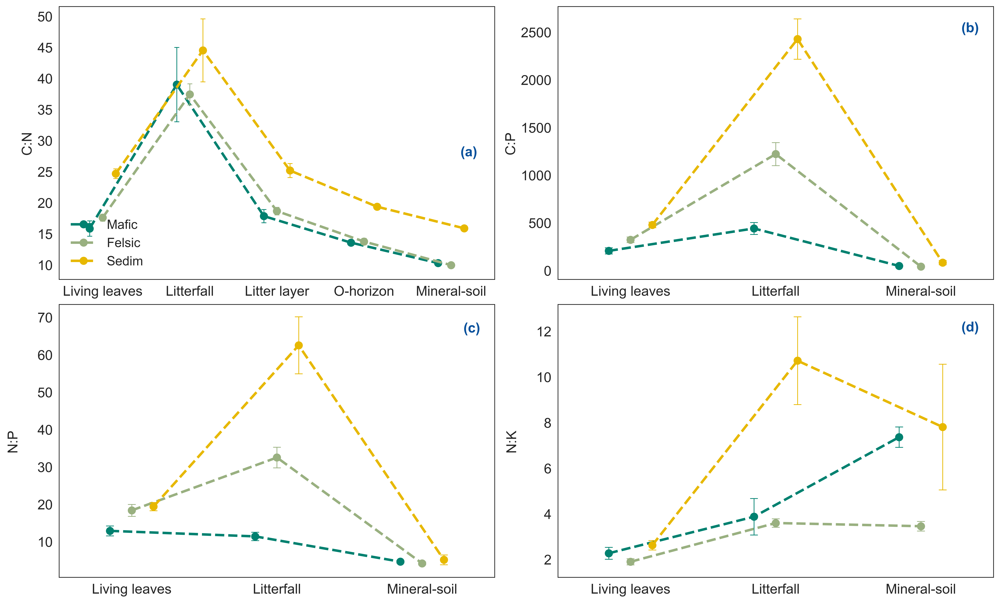

In [97]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
fig=plt.figure(figsize=[15,9])
plt.subplots_adjust(wspace=0.2, hspace=0.15)
geochem=["Mafic", "Felsic","Sedim"]
color_type=["Fresh leaves", "Litterfall", "Litter layer", "O-horizon",
           "Mineral-soil"]
color_type2=["Fresh leaves", "Litterfall",
           "Mineral-soil"]


plt.subplot(2,2,1)

sns.pointplot(x="type",y='CN',hue="region",errorbar="se", capsize=.05, linestyles="--", dodge=0.3, palette=colors,
              hue_order=colors,order=color_type,
errwidth=0.8,data=all_CN_data)
plt.xlabel("")
plt.ylabel('C:N',size=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.legend(loc="lower left")
plt.text(4.3,27.5, "(a)", horizontalalignment='right', size=15, color='#08519c',weight='bold')


plt.subplot(2,2,2)

sns.pointplot(x="type",y='CP',hue="region",errorbar="se", capsize=.05, linestyles="--", dodge=0.3, palette=colors,
              hue_order=colors,order=color_type2,
errwidth=0.8,data=all_CNPK_data)
plt.xlabel("")
plt.ylabel('C:P',size=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.legend('',frameon=False)
plt.text(2.4,2500, "(b)", horizontalalignment='right', size=15, color='#08519c',weight='bold')

plt.subplot(2,2,3)
sns.pointplot(x="type",y='NP',hue="region",errorbar="se", capsize=.05, linestyles="--", dodge=0.3, palette=colors,
              hue_order=colors,order=color_type2,
errwidth=0.8,data=all_CNPK_data)
plt.xlabel("")
plt.ylabel('N:P\n',size=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.legend('',frameon=False)
plt.text(2.4,66, "(c)", horizontalalignment='right', size=15, color='#08519c',weight='bold')

plt.subplot(2,2,4)

sns.pointplot(x="type",y='NK',hue="region",errorbar="se", capsize=.05, linestyles="--", dodge=0.3, palette=colors,
              hue_order=colors,order=color_type2,
errwidth=0.8,data=all_CNPK_data)
plt.xlabel("")
plt.ylabel('N:K\n',size=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.legend('',frameon=False);
plt.text(2.4,12, "(d)", horizontalalignment='right', size=15, color='#08519c',weight='bold');
#fig.savefig('figures/Fig3.png', dpi=600,bbox_inches='tight', pad_inches=0.1);

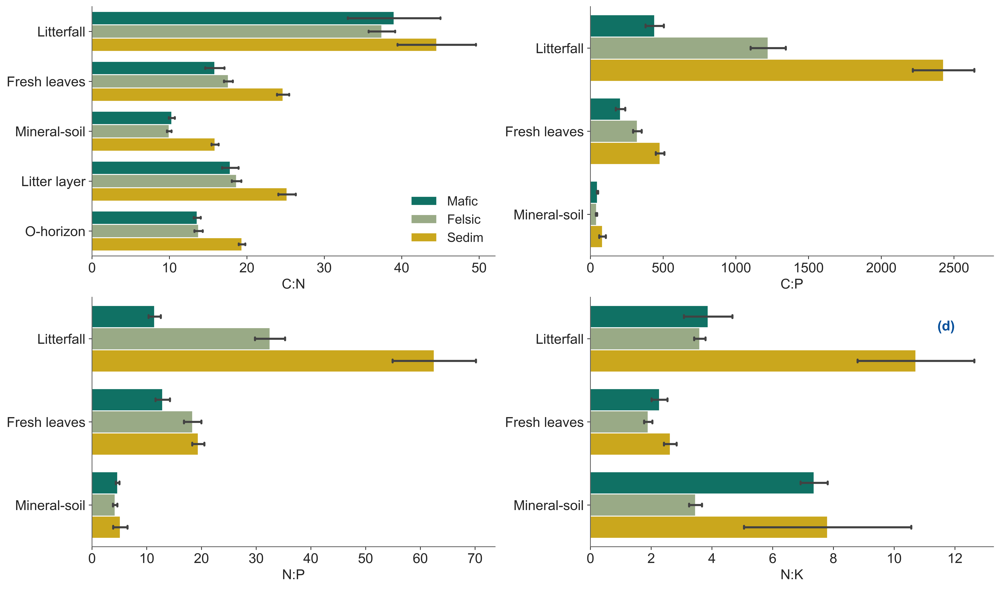

In [125]:
fig=plt.figure(figsize=[15,9])
plt.subplots_adjust(wspace=0.25, hspace=0.25)

plt.subplot(2,2,1)

sns.barplot(y="type",x='CN',hue="region", palette=colors,errorbar="se",capsize=0.1,
              hue_order=colors,
data=all_CN_data)
plt.ylabel("")
plt.xlabel('C:N',size=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.legend(loc="lower right")
#plt.text(4.3,27.5, "(a)", horizontalalignment='right', size=15, color='#08519c',weight='bold')


plt.subplot(2,2,2)

sns.barplot(y="type",x='CP',hue="region", palette=colors,errorbar="se",capsize=0.1,
              hue_order=colors,
data=all_CNPK_data)
plt.ylabel("")
plt.xlabel('C:P',size=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.legend('',frameon=False)
#plt.text(2.4,2500, "(b)", horizontalalignment='right', size=15, color='#08519c',weight='bold')

plt.subplot(2,2,3)
sns.barplot(y="type",x='NP',hue="region", palette=colors,errorbar="se",capsize=0.1,
              hue_order=colors,data=all_CNPK_data)
plt.ylabel("")
plt.xlabel('N:P\n',size=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.legend('',frameon=False)
#plt.text(2.4,66, "(c)", horizontalalignment='right', size=15, color='#08519c',weight='bold')

plt.subplot(2,2,4)

sns.barplot(y="type",x='NK',hue="region", palette=colors,errorbar="se",capsize=0.1,
              hue_order=colors,data=all_CNPK_data)
plt.ylabel("")
plt.xlabel('N:K\n',size=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.legend('',frameon=False)

plt.text(12,-0.1, "(d)", horizontalalignment='right', size=15, color='#08519c',weight='bold');
#fig.savefig('figures/Fig3.png', dpi=600,bbox_inches='tight', pad_inches=0.1);

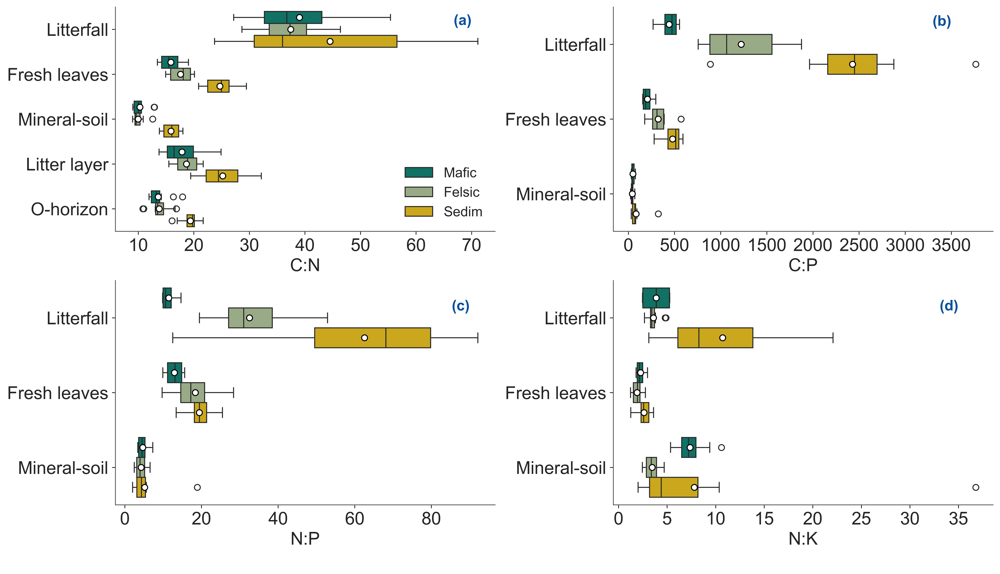

In [140]:
fig=plt.figure(figsize=[14,8])
plt.subplots_adjust(wspace=0.25, hspace=0.25)

plt.subplot(2,2,1)

sns.boxplot(y="type",x='CN',hue="region", palette=colors,showmeans=True, meanprops={"marker":"o",
                       "markerfacecolor":"white",
                       "markeredgecolor":"black"},
              hue_order=colors,
data=all_CN_data)
plt.ylabel("")
plt.xlabel('C:N',size=18)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
plt.legend(loc="lower right")
plt.text(70,-0.1, "(a)", horizontalalignment='right', size=15, color='#08519c',weight='bold')


plt.subplot(2,2,2)

sns.boxplot(y="type",x='CP',hue="region", palette=colors,showmeans=True,meanprops={"marker":"o",
                       "markerfacecolor":"white",
                       "markeredgecolor":"black"},
              hue_order=colors,
data=all_CNPK_data)
plt.ylabel("")
plt.xlabel('C:P',size=18)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
plt.legend('',frameon=False)
plt.text(3500,-0.25, "(b)", horizontalalignment='right', size=15, color='#08519c',weight='bold')

plt.subplot(2,2,3)
sns.boxplot(y="type",x='NP',hue="region", palette=colors,showmeans=True,meanprops={"marker":"o",
                       "markerfacecolor":"white",
                       "markeredgecolor":"black"},
              hue_order=colors,data=all_CNPK_data)
plt.ylabel("")
plt.xlabel('N:P\n',size=18)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
plt.legend('',frameon=False)
plt.text(90,-0.1, "(c)", horizontalalignment='right', size=15, color='#08519c',weight='bold')

plt.subplot(2,2,4)

sns.boxplot(y="type",x='NK',hue="region", palette=colors,showmeans=True,meanprops={"marker":"o",
                       "markerfacecolor":"white",
                       "markeredgecolor":"black"},
              hue_order=colors,data=all_CNPK_data)
plt.ylabel("")
plt.xlabel('N:K\n',size=18)
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
plt.legend('',frameon=False)
plt.text(35,-0.1, "(d)", horizontalalignment='right', size=15, color='#08519c',weight='bold');

#fig.savefig('figures/Fig3.png', dpi=600)

In [225]:
#Create a subset of canopy chemistry
traits_agg_sub=traits_agg[["plotID","N_mass", "P", "K","Ca","Mg","Na"]]
traits_agg_sub=traits_agg_sub.rename(columns={"N_mass":"N"})
traits_agg_sub.head()

,plotID,N,P,K,Ca,Mg,Na
0,KBPL1,30.000254,2.028663,9.145580,10.056992,2.615660,0.070924
1,KBPL10,33.857574,2.926664,17.117632,12.319769,3.696900,0.063301
2,KBPL11,28.049149,2.833704,15.504388,11.207066,3.143740,0.038320
3,KBPL12,25.471390,1.630316,10.967192,6.852107,3.007433,0.036358
4,KBPL4,30.970188,1.779991,12.740349,5.555784,3.418260,0.032779


In [ ]:
#look at the soil_10

soil_canopy=pd.merge(traits_agg_sub, soil_top, on="plotID", how="inner")
soil_canopy=soil_canopy.drop(columns=["region","type"])
soil_canopy.info()

In [32]:
#try correlations with soil properties in top 10cm
correlations=np.round(soil_canopy.iloc[:,1:].corr(method="pearson"), 1)
#keep the significant correlations only
sub_correlations=correlations>0.3
correlations=correlations[sub_correlations]
#sort the matrix of correlation values
correlations=correlations.loc[["N","P","K","Ca","Mg"],["pH_KCl","ECEC","P_avail","K_ex","Ca_ex","Mg_ex","Total_N","Total_P",
                                                        "Total_K","Total_Ca","Total_Mg"]]
#print the new matrix
correlations
#save correlation matrix for future users
correlations.to_csv("\\\\storage.slu.se\\home_2$\\bebu0001\\Documents\\slu\\3_paper-projects\\nutrient-resorp\\processed\\correlations.csv")

In [147]:
#read the correlation
correlations=pd.read_csv(processed+"\\correlations.csv", index_col=0)

correlations

,pH_KCl,ECEC,P_avail,K_ex,Ca_ex,Mg_ex,Total_N,Total_P,Total_K,Total_Ca,Total_Mg
N,NaN,0.4,0.4,0.4,0.4,0.5,0.4,0.4,NaN,NaN,0.5
P,NaN,0.5,0.4,0.6,0.4,0.7,0.5,0.5,NaN,NaN,0.6
K,0.5,0.5,NaN,0.6,0.5,0.5,NaN,NaN,0.4,0.4,0.5
Ca,0.9,0.7,NaN,0.7,0.8,0.6,NaN,NaN,0.8,0.8,0.8
Mg,NaN,NaN,NaN,0.4,NaN,0.7,0.4,0.4,NaN,NaN,0.4


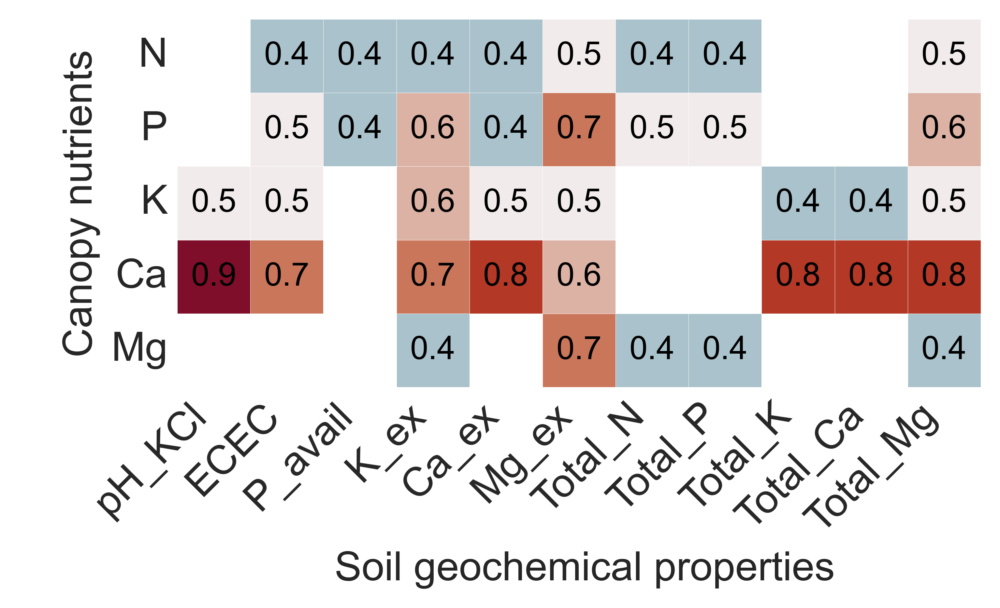

In [149]:
#create the figure
#plt.style.use("_mpl-gallery")
fig= plt.figure(figsize=[5,3])
ax=sns.heatmap(correlations,cmap="cmo.balance",annot=True,fmt='.1f', annot_kws={"size": 12, "color":"black"},
vmin=0.0, vmax=1.0,cbar=False, linewidths=0.1, linecolor='white', cbar_ax=True,
robust=True, cbar_kws={'spacing':'uniform'})
# set the x-labels with
_, xlabels = plt.xticks()
_, ylabels = plt.yticks()
ax.set_xticklabels(xlabels,size=15,rotation=45, ha="right")
ax.set_yticklabels(ylabels,size=15,rotation=0, ha="right")

plt.ylabel("\nCanopy nutrients", fontsize=15)
plt.xlabel(" Soil geochemical properties",fontsize=15)
plt.show();
#fig.savefig('figures/Fig4.png', dpi=600,bbox_inches='tight', pad_inches=0.15);

In [161]:
#read resorption data fromm a local drive
litter_fresh_df_agg=pd.read_csv(processed+'litter_fresh_df_agg.csv')
litter_fresh_df_agg.head()

,plotID,region,Ca_mg_kg_dry_weight,K_mg_kg_dry_weight,Mg_mg_kg_dry_weight,P_mg_kg_dry_weight,litter_C,litter_N,N_mass,C_mass,...,lit_K_adj,lit_P_adj,lit_Mg_adj,N_resorp,K_resorp,P_resorp,Mg_resorp,NP_resorp,NK_resorp,NMg_resorp
0,KBPL10,Mafic,17.213000,8.920000,4.113000,2.233000,428.000000,22.000000,33.857574,455.139414,...,6.384264,1.598213,2.943776,53.493589,62.703580,45.391308,20.371786,1.178499,0.853119,2.625866
1,KBPL11,Mafic,18.272905,7.237891,4.011445,1.622903,435.750000,18.250000,28.049149,462.611250,...,4.439115,0.995352,2.460283,60.094982,71.368655,64.874511,21.740237,0.926327,0.842036,2.764228
2,KBPL12,Mafic,16.684012,3.713351,7.018714,1.946526,443.750000,19.500000,25.471390,484.933781,...,1.525069,0.799436,2.882579,68.558330,86.094258,50.964346,4.151535,1.345221,0.796317,16.513970
3,KBPL6,Mafic,18.634068,4.807062,5.470394,1.727377,436.000000,25.333333,31.531142,456.493925,...,2.394486,0.860438,2.724904,59.979246,77.279978,60.199699,51.418205,0.996338,0.776129,1.166498
4,NPL1,Sedim,5.459219,0.782710,1.338704,0.187631,470.571429,17.285714,18.656642,493.595290,...,0.898079,0.215288,1.536024,-6.308370,87.566394,78.173771,30.021796,-0.080697,-0.072041,-0.210126


In [162]:
#merge resoption data and geochemical data
import warnings
warnings.simplefilter(action="ignore")
resorp_df=litter_fresh_df_agg[["plotID","region","N_resorp","P_resorp","K_resorp","Mg_resorp", "NP_resorp","NK_resorp","NMg_resorp"]]
resorp_df.head()

,plotID,region,N_resorp,P_resorp,K_resorp,Mg_resorp,NP_resorp,NK_resorp,NMg_resorp
0,KBPL10,Mafic,53.493589,45.391308,62.703580,20.371786,1.178499,0.853119,2.625866
1,KBPL11,Mafic,60.094982,64.874511,71.368655,21.740237,0.926327,0.842036,2.764228
2,KBPL12,Mafic,68.558330,50.964346,86.094258,4.151535,1.345221,0.796317,16.513970
3,KBPL6,Mafic,59.979246,60.199699,77.279978,51.418205,0.996338,0.776129,1.166498
4,NPL1,Sedim,-6.308370,78.173771,87.566394,30.021796,-0.080697,-0.072041,-0.210126


In [221]:
# #rename plotID in litter CN data
# resorp_df=resorp_df.replace({"plotID":{"KBPL13":"KBPL5","KBPL14":"KBPL1",
#                                        "KBPL15":"KBPL8","KBPL16":"KBPL9"}})

print(soil_10.plotID.unique())
print(resorp_df.plotID.unique())

['KBPL10' 'KBPL11' 'KBPL12' 'KBPL1' 'KBPL2' 'KBPL3' 'KBPL4' 'KBPL5'
 'KBPL6' 'KBPL7' 'KBPL8' 'KBPL9' 'NPL10' 'NPL11' 'NPL12' 'NPL1' 'NPL2'
 'NPL3' 'NPL4' 'NPL5' 'NPL6' 'NPL7' 'NPL8' 'NPL9' 'UPL10' 'UPL11' 'UPL12'
 'UPL1' 'UPL2' 'UPL3' 'UPL4' 'UPL5' 'UPL6' 'UPL7' 'UPL8' 'UPL9']
['KBPL10' 'KBPL11' 'KBPL12' 'KBPL6' 'NPL1' 'NPL10' 'NPL11' 'NPL12' 'NPL2'
 'NPL3' 'NPL4' 'NPL6' 'NPL7' 'NPL8' 'NPL9' 'UPL1' 'UPL10' 'UPL11' 'UPL12'
 'UPL2' 'UPL3' 'UPL4' 'UPL5' 'UPL6' 'UPL7' 'UPL8' 'UPL9']


In [37]:
#merge top 10 cm soils and resorption
resorp_soil=soil_top.merge(resorp_df,on=["plotID","region"], how="inner")
resorp_soil=resorp_soil.drop(columns=["type"])
print(resorp_soil.shape)
# print(resorp_soil.plotID.unique())
resorp_soil.head()

(27, 27)


,plotID,region,pH_KCl,ECEC,P_avail,K_ex,Ca_ex,Mg_ex,Total_N,Total_C,...,NK,NCa,NMg,N_resorp,P_resorp,K_resorp,Mg_resorp,NP_resorp,NK_resorp,NMg_resorp
0,KBPL10,Mafic,5.40,33.206,32.78,0.793,24.251,7.359,0.95088,8.58088,...,5.838634,2.249752,2.215161,53.493589,45.391308,62.703580,20.371786,1.178499,0.853119,2.625866
1,KBPL11,Mafic,4.35,15.772,35.25,1.279,8.972,3.578,0.72923,7.53175,...,4.754091,2.174404,1.530549,60.094982,64.874511,71.368655,21.740237,0.926327,0.842036,2.764228
2,KBPL12,Mafic,3.60,9.991,33.76,0.332,2.904,1.405,0.93539,9.74146,...,7.901588,4.945752,2.770459,68.558330,50.964346,86.094258,4.151535,1.345221,0.796317,16.513970
3,KBPL6,Mafic,4.60,19.625,7.74,0.332,11.776,6.714,0.64698,5.89921,...,4.682154,2.164609,1.800618,59.979246,60.199699,77.279978,51.418205,0.996338,0.776129,1.166498
4,NPL10,Sedim,2.97,5.689,15.57,0.179,0.319,0.174,0.35169,6.23114,...,3.898570,3.218836,2.161320,51.996127,78.424367,78.750055,39.404383,0.663010,0.660268,1.319552


In [200]:
corr=np.round(resorp_soil.iloc[:,2:].corr(), 1)
corr_subset=corr.loc[["N_resorp","P_resorp","K_resorp","Mg_resorp","NP_resorp","NK_resorp"], 
                     ["pH_KCl","ECEC","P_avail","K_ex","Ca_ex","Mg_ex","Total_N","Total_P","Total_K","Total_Ca","Total_Mg"]]

list_t=[-0.3,-0.2,-0.1,0,0.1,0.2,0.3]

def remove_elem(list_t, matrix):
    for i in list_t:
        matrix=matrix[matrix!=i]
    return matrix

corr_subset=remove_elem(list_t, corr_subset)
corr_subset=corr_subset.rename({"N_resorp":"Nr", "P_resorp":"Pr","K_resorp":"Kr", "Mg_resorp":"Mgr", "NP_resorp":"NPr", "NK_resorp":"NKr"})

corr_subset

,pH_KCl,ECEC,P_avail,K_ex,Ca_ex,Mg_ex,Total_N,Total_P,Total_K,Total_Ca,Total_Mg
Nr,0.4,NaN,0.5,0.4,0.4,0.4,NaN,NaN,0.5,0.4,0.5
Pr,NaN,NaN,-0.6,-0.4,NaN,-0.4,-0.4,NaN,-0.4,-0.5,-0.6
Kr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.5,-0.5,-0.5
Mgr,NaN,NaN,-0.5,NaN,NaN,NaN,-0.4,NaN,-0.4,-0.5,-0.5
NPr,NaN,NaN,0.7,0.4,0.4,0.5,NaN,NaN,0.5,0.5,0.6
NKr,0.5,0.4,0.6,0.5,0.5,0.5,NaN,NaN,0.7,0.6,0.7


In [160]:
biomass_data=pd.read_csv('biomass_data_complete.csv', delimiter=';')
biomass_data.head()

,region,slope,plot_id,plotID,CWM_N,CWM_CN,RGR,wd,ACW_Cstock,L_O_Cstock,...,Total_Ca,Total_K,Total_Mg,TRB,Total_P,Total_N,CN,SOC,MAP,MAT
0,Felsic,PL,UPL1,UPL1,2.762417,17.571194,3.793229,0.518001,133.225822,5.126365,...,0.35766,0.14364,0.30043,0.80173,0.039455,0.50676,9.574809,175.473604,1702,19.2
1,Felsic,V,UPL10,UPL10,2.436939,17.712315,6.127294,0.553606,49.515919,3.779753,...,0.42218,0.17442,0.36606,0.96266,0.091469,0.33458,10.110586,130.888834,1702,19.2
2,Felsic,V,UPL11,UPL11,2.738659,17.792321,5.597379,0.536808,85.942411,2.895072,...,0.43067,0.16950,0.35265,0.95282,0.086812,0.32561,9.498664,107.198857,1702,19.2
3,Felsic,V,UPL12,UPL12,2.401791,19.987860,2.970170,0.524670,143.924593,6.216836,...,0.40295,0.16861,0.32031,0.89187,0.033731,0.26074,11.649267,102.284040,1702,19.2
4,Felsic,PL,UPL2,UPL2,2.964903,16.475138,3.648227,0.534013,122.952875,5.448112,...,0.37696,0.15867,0.30823,0.84386,0.034837,0.40728,9.925825,113.616765,1702,19.2


In [186]:
#rename the sedimentary region
biomass_data=biomass_data.replace({"region":{"Mixed":"Sedim"}})
biomass_data.region.unique()

array(['Felsic', 'Mafic', 'Sedim'], dtype=object)

In [ ]:
#plot fig 1d
fig= plt.figure(figsize=(5,5))
sns.barplot(biomass_data, x="region", y="L_O_Cstock",  errorbar="se", palette=colors, capsize=.05)
plt.xlabel("")
plt.yticks(fontsize=12)
plt.xticks(fontsize=15)
plt.ylabel('Litter & O-horizon layer C stocks \n [Mg.ha$^{-1}$]',size=15, weight="bold")
plt.show();
#fig.savefig('figures/Fig1d.png', dpi=600,bbox_inches='tight', pad_inches=0.1);

In [166]:
biomass_resorp=biomass_data[["plotID","RGR","wd","ACW_Cstock","L_O_Cstock","Root_Cstock","NPProot",
                             "NPPLitter","NPPACW","dbh","Tree_height"]].merge(resorp_df,on=["plotID"], how="inner")
biomass_resorp.head()

,plotID,RGR,wd,ACW_Cstock,L_O_Cstock,Root_Cstock,NPProot,NPPLitter,NPPACW,dbh,Tree_height,region,N_resorp,P_resorp,K_resorp,Mg_resorp,NP_resorp,NK_resorp,NMg_resorp
0,UPL1,3.793229,0.518001,133.225822,5.126365,7.440472,2.793304,4.642500,4.833815,28.252239,16.075000,Felsic,53.687288,76.513001,83.970588,30.229807,0.701675,0.639358,1.775972
1,UPL10,6.127294,0.553606,49.515919,3.779753,6.704200,1.833236,2.882996,2.824686,27.659375,18.200000,Felsic,51.604240,47.824917,61.443716,0.423576,1.079024,0.839862,121.830051
2,UPL11,5.597379,0.536808,85.942411,2.895072,9.211360,2.321192,3.107794,4.506130,27.805769,19.945455,Felsic,47.995383,59.392039,64.667081,14.328645,0.808111,0.742192,3.349611
3,UPL12,2.970170,0.524670,143.924593,6.216836,7.555085,2.596480,3.269885,4.128322,35.619149,19.433333,Felsic,53.439223,79.274349,75.440285,15.161867,0.674105,0.708365,3.524581
4,UPL2,3.648227,0.534013,122.952875,5.448112,6.731443,1.670605,2.901930,4.297797,26.640964,16.476923,Felsic,53.043017,53.511144,68.850663,33.414514,0.991252,0.770407,1.587424


In [167]:
#Load the fine roots data
fine_roots=pd.read_excel("fine_roots.xlsx")
fine_roots.head()

,plotID,region,layer,production
0,KBPL10,Mafic,1,0.040475
1,KBPL10,Mafic,2,0.165059
2,KBPL10,Mafic,3,0.039747
3,KBPL10,Mafic,4,0.030523
4,KBPL10,Mafic,O,0.188761


In [6]:
fine_roots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160 entries, 0 to 159
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   plotID      160 non-null    object 
 1   region      160 non-null    object 
 2   layer       160 non-null    object 
 3   production  160 non-null    float64
dtypes: float64(1), object(3)
memory usage: 5.1+ KB


In [168]:
# Calculate the sum of coverage for each plotID layer
total_roots = fine_roots.groupby('plotID')['production'].transform(sum)
# Create a new column proportion
fine_roots['proportion'] = fine_roots['production']*100/total_roots
fine_roots.head()

,plotID,region,layer,production,proportion
0,KBPL10,Mafic,1,0.040475,8.712546
1,KBPL10,Mafic,2,0.165059,35.529739
2,KBPL10,Mafic,3,0.039747,8.555802
3,KBPL10,Mafic,4,0.030523,6.570266
4,KBPL10,Mafic,O,0.188761,40.631647


In [169]:
#melt the fine rooots data by converting depth to columns
fine_roots_pivot=pd.pivot_table(fine_roots,index="plotID", columns="layer", values="proportion").reset_index()
fine_roots_pivot=fine_roots_pivot.rename(columns={1:"roots 0-10cm",2:"roots 10-20cm",3:"roots 20-30cm",
                                                  4:"roots 30-50cm", "O":"roots O-horizon"})
fine_roots_pivot.head()

layer,plotID,roots 0-10cm,roots 10-20cm,roots 20-30cm,roots 30-50cm,roots O-horizon
0,KBPL10,8.712546,35.529739,8.555802,6.570266,40.631647
1,KBPL11,3.715469,10.968974,2.570883,5.403165,77.341509
2,KBPL12,13.731822,9.531653,4.497085,5.126193,67.113248
3,KBPL13,29.332619,4.534977,5.593139,6.802466,53.736800
4,KBPL14,11.480891,1.742882,3.491651,0.788152,82.496424


In [170]:
resorp_root_density=fine_roots_pivot.merge(resorp_df[["plotID","N_resorp","NP_resorp","P_resorp","K_resorp","NK_resorp","Mg_resorp"]],on=["plotID"], how="inner")
resorp_biomass=resorp_root_density.merge(biomass_data[['plotID', 'RGR', 'wd','ACW_Cstock', 'L_O_Cstock', 'Root_Cstock', 'NPProot', 'NPPLitter',
       'NPPACW', 'totalNPP', 'root_allocation','litter_allocation', 'ACW_allocation']],on="plotID", how="inner")
resorp_biomass.head()

,plotID,roots 0-10cm,roots 10-20cm,roots 20-30cm,roots 30-50cm,roots O-horizon,N_resorp,NP_resorp,P_resorp,K_resorp,...,ACW_Cstock,L_O_Cstock,Root_Cstock,NPProot,NPPLitter,NPPACW,totalNPP,root_allocation,litter_allocation,ACW_allocation
0,KBPL10,8.712546,35.529739,8.555802,6.570266,40.631647,53.493589,1.178499,45.391308,62.703580,...,87.266481,14.680601,3.657186,0.464566,4.194556,6.110827,10.769948,0.043135,0.389468,0.567396
1,KBPL11,3.715469,10.968974,2.570883,5.403165,77.341509,60.094982,0.926327,64.874511,71.368655,...,120.252396,11.281954,4.038030,2.766541,4.725869,8.421607,15.914017,0.173843,0.296963,0.529194
2,KBPL12,13.731822,9.531653,4.497085,5.126193,67.113248,68.558330,1.345221,50.964346,86.094258,...,72.684664,9.729831,5.962814,1.288813,4.608301,4.508945,10.406059,0.123852,0.442848,0.433300
3,KBPL6,28.661679,17.212326,7.061573,11.090548,35.973873,59.979246,0.996338,60.199699,77.279978,...,115.469875,7.186845,7.368538,0.941409,5.538176,7.202652,13.682238,0.068805,0.404771,0.526424
4,NPL1,9.773700,6.585645,1.864619,2.459086,79.316951,-6.308370,-0.080697,78.173771,87.566394,...,188.963371,53.949276,14.739760,6.060279,4.312070,4.200089,14.572437,0.415873,0.295906,0.288221


In [219]:
corr2=np.round(resorp_biomass.iloc[:,1:].corr(), 1)
corr2
corr_subset2=corr2.loc[["N_resorp","P_resorp","K_resorp","Mg_resorp","NP_resorp","NK_resorp"], 
                       ['RGR', 'wd','ACW_Cstock', 'L_O_Cstock', 'Root_Cstock','roots O-horizon','roots 0-10cm', 'roots 10-20cm', 'roots 20-30cm',
       'roots 30-50cm']]
corr_subset2=remove_elem(list_t, corr_subset2)
corr_subset2=corr_subset2.rename({"N_resorp":"Nr", "P_resorp":"Pr","K_resorp":"Kr", "Mg_resorp":"Mgr", "NP_resorp":"NPr", "NK_resorp":"NKr"})
corr_subset2

,RGR,wd,ACW_Cstock,L_O_Cstock,Root_Cstock,roots O-horizon,roots 0-10cm,roots 10-20cm,roots 20-30cm,roots 30-50cm
N_r,0.5,-0.4,-0.4,-0.7,-0.5,-0.4,NaN,NaN,0.4,0.4
P_r,-0.5,0.5,0.5,0.4,0.5,NaN,NaN,-0.5,NaN,NaN
K_r,NaN,NaN,0.4,NaN,0.4,0.4,NaN,-0.5,NaN,NaN
Mg_r,-0.5,NaN,0.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NP_r,0.5,-0.5,-0.5,-0.6,-0.6,-0.4,NaN,0.5,NaN,NaN
NK_r,0.6,-0.5,-0.5,-0.7,-0.6,-0.5,0.4,0.5,0.4,NaN


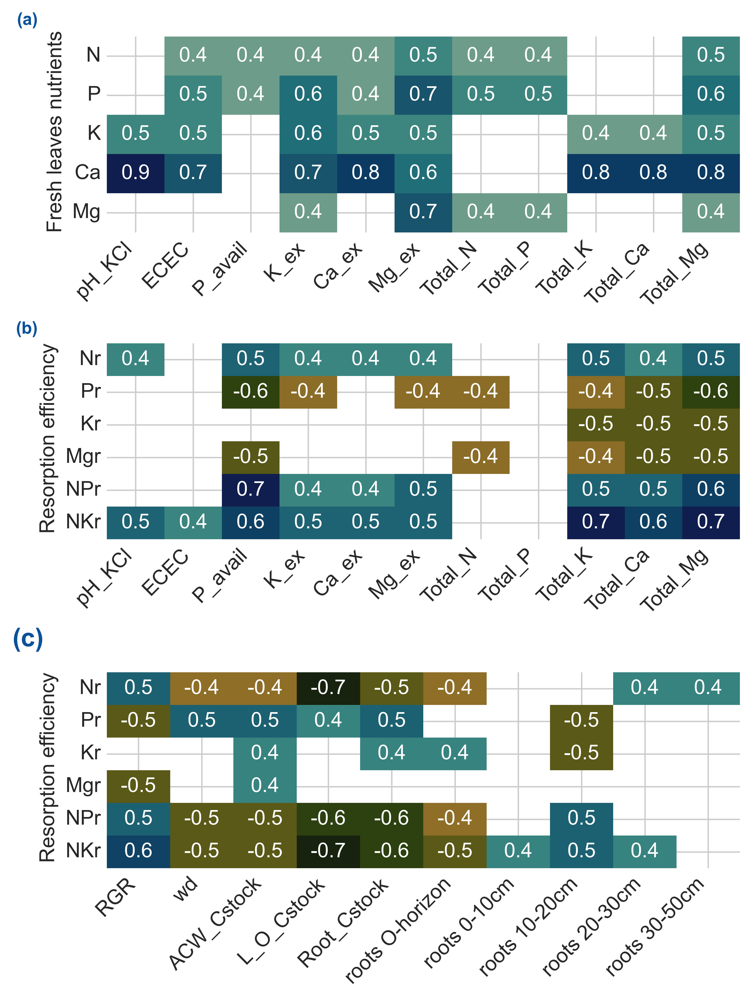

In [217]:
# plot correlations between nutrient resorption, soil properties and biomass stocks
plt.style.use("_mpl-gallery")
fig=plt.figure(figsize=[6,8])
plt.subplots_adjust(hspace=0.5)
plt.subplot(311)

plt.text(-1.2,-0.3, "(a)", horizontalalignment='right',  color='#08519c',weight='bold')
sns.heatmap(correlations, annot=True,cmap='cmo.tarn',fmt='.1f',annot_kws={"size": 12, "color":"white"},
           cbar=False,center=0)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0, ha="right")
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.ylabel("\n Fresh leaves nutrients", fontsize=12)

plt.subplot(312)
plt.text(-1.2,-0.3, "(b)", horizontalalignment='right',  color='#08519c',weight='bold')
sns.heatmap(corr_subset, annot=True,cmap='cmo.tarn',fmt='.1f',annot_kws={"size": 12, "color":"white"},
           cbar=False,center=0)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0, ha="right")
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.ylabel("\n Resorption efficiency", fontsize=12)

plt.subplot(313)
plt.text(-1,-0.8, "(c)", horizontalalignment='right', size=15, color='#08519c',weight='bold')
sns.heatmap(corr_subset2, annot=True,cmap='cmo.tarn',fmt='.1f',annot_kws={"size": 12, "color":"white"},
           cbar=False,center=0)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0, ha="right")
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.ylabel("\n Resorption efficiency", fontsize=12)
plt.show()
#fig.savefig('figures/Fig-S1.png', dpi=600,bbox_inches='tight', pad_inches=0.05);

In [ ]:
resorp_soil["TRB"]=resorp_soil.Total_K+resorp_soil.Total_Ca+resorp_soil.Total_Mg+resorp_soil.Total_Na
resorp_soil["Base_ex"]=resorp_soil.K_ex+resorp_soil.Ca_ex+resorp_soil.Mg_ex+resorp_soil.Na_ex
# store cleaned data on the local drive
resorp_soil.to_csv("processed/resorpt_soil.csv", index=False)

In [167]:
resorp_soil.to_csv("\\\\storage.slu.se\\home_2$\\bebu0001\Desktop\\resorpt_soil.csv", index=False)

In [6]:
# Read cleaned data from the local drive
resorp_soil=pd.read_csv(processed+"resorpt_soil.csv")
resorp_soil.head()

,plotID,region,pH_KCl,ECEC,P_avail,K_ex,Ca_ex,Mg_ex,Total_N,Total_C,...,NMg,N_resorp,P_resorp,K_resorp,Mg_resorp,NP_resorp,NK_resorp,NMg_resorp,TRB,Base_ex
0,KBPL10,Mafic,5.40,33.206,32.78,0.793,24.251,7.359,0.95088,8.58088,...,2.215161,53.493589,45.391308,62.703580,20.371786,1.178499,0.853119,2.625866,1.01478,32.403
1,KBPL11,Mafic,4.35,15.772,35.25,1.279,8.972,3.578,0.72923,7.53175,...,1.530549,60.094982,64.874511,71.368655,21.740237,0.926327,0.842036,2.764228,0.96521,13.829
2,KBPL12,Mafic,3.60,9.991,33.76,0.332,2.904,1.405,0.93539,9.74146,...,2.770459,68.558330,50.964346,86.094258,4.151535,1.345221,0.796317,16.513970,0.64514,4.641
3,KBPL6,Mafic,4.60,19.625,7.74,0.332,11.776,6.714,0.64698,5.89921,...,1.800618,59.979246,60.199699,77.279978,51.418205,0.996338,0.776129,1.166498,0.79638,18.822
4,NPL10,Sedim,2.97,5.689,15.57,0.179,0.319,0.174,0.35169,6.23114,...,2.161320,51.996127,78.424367,78.750055,39.404383,0.663010,0.660268,1.319552,0.36219,0.672


In [8]:
resorp_soil.iloc[:,2:].columns

Index(['pH_KCl', 'ECEC', 'P_avail', 'K_ex', 'Ca_ex', 'Mg_ex', 'Total_N',
       'Total_C', 'Total_Ca', 'Total_K', 'Total_Mg', 'Total_P', 'CN', 'CP',
       'NP', 'NK', 'NCa', 'NMg', 'N_resorp', 'P_resorp', 'K_resorp',
       'Mg_resorp', 'NP_resorp', 'NK_resorp', 'NMg_resorp', 'TRB', 'Base_ex'],
      dtype='object')

In [7]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

trans = StandardScaler()
# fit and transform the data

cov_trans = trans.fit_transform(resorp_soil.iloc[:,2:])
# convert the array back to a dataframe
cov_trans=pd.DataFrame(cov_trans , columns=resorp_soil.iloc[:,2:].columns)
cov_trans["region"]=resorp_soil["region"]
cov_trans.head()

,pH_KCl,ECEC,P_avail,K_ex,Ca_ex,Mg_ex,Total_N,Total_C,Total_Ca,Total_K,...,N_resorp,P_resorp,K_resorp,Mg_resorp,NP_resorp,NK_resorp,NMg_resorp,TRB,Base_ex,region
0,0.945653,2.703540,1.237903,1.299610,2.075542,2.812986,2.698575,1.571180,1.383110,1.100641,...,0.268220,-1.787604,-1.314786,-0.741182,1.311233,0.930828,-0.178226,1.493802,2.279181,Mafic
1,0.048318,0.198052,1.427148,2.943482,0.086865,0.844597,1.547751,1.090735,0.760575,0.908141,...,0.658362,-0.457578,-0.529326,-0.652999,0.566442,0.880764,-0.172151,1.328253,0.331376,Mafic
2,-0.592636,-0.632751,1.312988,-0.259701,-0.702932,-0.286667,2.618150,2.102664,-0.282380,0.196482,...,1.158545,-1.407159,0.805500,-1.786411,1.803649,0.674237,0.431587,0.259318,-0.632145,Mafic
3,0.261969,0.751777,-0.680599,-0.259701,0.451826,2.477199,1.120703,0.343118,0.500407,0.598963,...,0.651522,-0.776705,0.006515,1.259441,0.773221,0.583041,-0.242306,0.764413,0.854978,Mafic
4,-1.131037,-1.251003,-0.080684,-0.777216,-1.039389,-0.927526,-0.412466,0.495125,-0.851997,-0.376138,...,0.179720,0.467406,0.139773,0.485274,-0.211265,0.059657,-0.235585,-0.685647,-1.048363,Sedim


In [275]:
#Specify model and examine priors
seed=7
model_P = bmb.Model("P_resorp ~ 0+P_avail + Total_Ca+P_avail + Total_Ca|region)", cov_trans, categorical="region")
fitted_P = model_P.fit(tune=2000, draws=2000, init="adapt_diag", random_seed=seed,cores=None,inference_method='mcmc')

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [P_resorp_sigma, P_avail, Total_Ca, 1|region_sigma, 1|region_offset, P_avail|region_sigma, P_avail|region_offset, Total_Ca|region_sigma, Total_Ca|region_offset]


Output()

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 104 seconds.
There were 249 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In [276]:
az.summary(fitted_P)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
1|region[Felsic],0.528,0.351,-0.107,1.147,0.008,0.006,1756.0,2793.0,1.00
1|region[Mafic],-0.372,0.451,-1.215,0.487,0.015,0.011,828.0,300.0,1.01
1|region[Sedim],-0.491,0.488,-1.458,0.325,0.012,0.008,1801.0,3253.0,1.00
1|region_sigma,0.903,0.663,0.000,2.077,0.016,0.011,1566.0,1889.0,1.00
P_avail,-0.330,0.534,-1.217,1.095,0.044,0.032,258.0,142.0,1.01
P_avail|region[Felsic],0.078,0.536,-1.220,1.059,0.044,0.031,269.0,152.0,1.01
P_avail|region[Mafic],0.001,0.531,-1.284,1.077,0.038,0.027,300.0,195.0,1.01
P_avail|region[Sedim],-0.092,0.541,-1.571,0.744,0.044,0.032,278.0,152.0,1.01
P_avail|region_sigma,0.571,0.679,0.000,1.870,0.044,0.033,385.0,286.0,1.01
P_resorp_sigma,0.778,0.128,0.565,1.018,0.003,0.002,1294.0,578.0,1.00


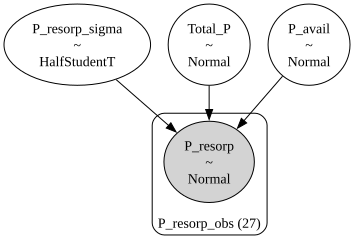

In [93]:
model_P.build()

model_P.graph()

In [138]:
#"Examine the model results"
az.summary(fitted_P)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,-0.001,0.171,-0.315,0.333,0.001,0.001,14513.0,9974.0,1.0
P_avail,-0.533,0.175,-0.859,-0.196,0.002,0.001,12274.0,9093.0,1.0
P_resorp_sigma,0.866,0.129,0.637,1.104,0.001,0.001,11814.0,8559.0,1.0
Total_P,-0.203,0.170,-0.522,0.117,0.001,0.001,13100.0,9360.0,1.0


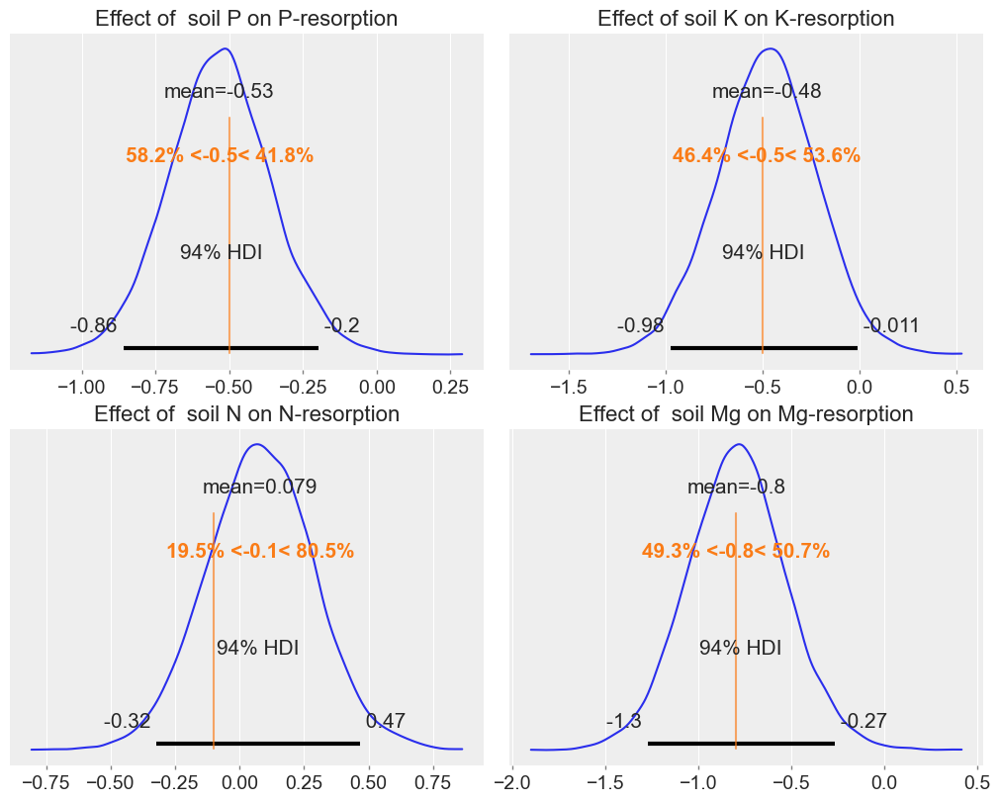

In [159]:
#Plot Posterior densities for a few selected variables

fig, axs=plt.subplots(ncols=2, nrows=2, sharex=False, sharey=False, figsize=(10, 8))

az.plot_posterior(fitted_P,var_names=["P_avail"], filter_vars="regex", ax=axs[0,0], ref_val=[-0.5])
axs[0,0].set_title("Effect of  soil P on P-resorption")
az.plot_posterior(fitted_K, var_names=["Total_K"], filter_vars="regex", ax=axs[0,1], ref_val=[-0.5] )
axs[0,1].set_title("Effect of soil K on K-resorption")
az.plot_posterior(fitted_N, var_names=["Total_N"], filter_vars="regex", ax=axs[1,0], ref_val=[-0.1])
axs[1,0].set_title("Effect of  soil N on N-resorption")
az.plot_posterior(fitted_Mg, var_names=["Total_Mg"], filter_vars="regex", ax=axs[1,1], ref_val=[-0.8] )
axs[1,1].set_title("Effect of  soil Mg on Mg-resorption")


plt.savefig('figures/Fig7.png', dpi=600,bbox_inches='tight', pad_inches=0.1);

In [11]:
pd.set_option("display.max_columns", None)
cov_trans.iloc[:,0:-1].describe()

,pH_KCl,ECEC,P_avail,K_ex,Ca_ex,Mg_ex,Total_N,Total_C,Total_Ca,Total_K,Total_Mg,Total_P,CN,CP,NP,NK,NCa,NMg,N_resorp,P_resorp,K_resorp,Mg_resorp,NP_resorp,NK_resorp,NMg_resorp,TRB,Base_ex
count,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01
mean,7.134211e-16,-2.055969e-17,-2.528841e-16,8.635068e-17,5.345518e-17,1.665335e-16,-1.099943e-16,-6.476301e-16,-3.042833e-16,-6.167906e-18,-5.461166e-17,5.551115e-17,8.470590e-16,1.809252e-16,2.117648e-16,-1.768133e-16,-6.167906e-17,1.213021e-16,1.274701e-16,5.098802e-16,8.018277e-16,2.487722e-16,-2.467162e-16,4.482011e-16,-3.495147e-17,1.439178e-16,-5.345518e-17
std,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00,1.019049e+00
min,-1.378872e+00,-1.267818e+00,-1.128045e+00,-1.210170e+00,-1.077004e+00,-9.806275e-01,-1.191901e+00,-1.295369e+00,-1.586287e+00,-1.751890e+00,-1.681503e+00,-9.088454e-01,-1.072414e+00,-7.950148e-01,-1.021258e+00,-7.585491e-01,-3.554208e-01,-6.744308e-01,-3.266069e+00,-2.296936e+00,-2.894941e+00,-2.026640e+00,-2.407806e+00,-3.248426e+00,-3.027520e-01,-1.501968e+00,-1.095973e+00
25%,-1.045576e+00,-7.896136e-01,-9.238594e-01,-8.651600e-01,-1.057481e+00,-9.415824e-01,-6.590123e-01,-8.719468e-01,-9.279507e-01,-8.588096e-01,-7.885673e-01,-6.999575e-01,-8.953452e-01,-5.459359e-01,-6.386524e-01,-6.069185e-01,-3.231431e-01,-5.041307e-01,-2.470466e-01,-8.042730e-01,-6.434500e-01,-6.906366e-01,-3.927763e-01,-1.411764e-01,-2.480839e-01,-8.083141e-01,-1.075838e+00
50%,2.021467e-01,-2.283329e-03,-2.936806e-01,-2.597010e-01,1.505117e-01,-1.393375e-01,-2.234228e-01,-3.047845e-01,1.833270e-01,9.017040e-02,-1.388502e-01,-2.447656e-01,-5.313583e-01,-3.123736e-01,-3.849944e-01,-4.474308e-01,-2.778886e-01,-3.739255e-01,2.415913e-01,4.300410e-01,2.655919e-01,-5.522158e-02,-9.706648e-02,2.769257e-01,-2.240986e-01,4.474320e-02,3.046346e-01
75%,9.285608e-01,5.388670e-01,9.150767e-01,7.364313e-01,6.635928e-01,4.632573e-01,3.628927e-01,7.490240e-01,8.400591e-01,8.090454e-01,8.202600e-01,1.568109e-01,9.109845e-01,1.500042e-01,4.571137e-01,1.712715e-01,-9.033929e-02,2.151893e-02,6.549416e-01,7.278965e-01,7.541405e-01,5.110769e-01,4.720675e-01,6.286389e-01,-1.751886e-01,8.526312e-01,6.870857e-01
max,1.646429e+00,2.703540e+00,2.010207e+00,2.943482e+00,2.075542e+00,2.812986e+00,2.698575e+00,2.102664e+00,1.767301e+00,1.624069e+00,2.043237e+00,3.259566e+00,1.780552e+00,4.363990e+00,4.044372e+00,3.138237e+00,4.988993e+00,4.111783e+00,1.215308e+00,1.417029e+00,1.503272e+00,2.332679e+00,2.465479e+00,1.092069e+00,5.055914e+00,1.696388e+00,2.279181e+00


In [36]:
#Hierarchical Multiple Linear Regression
seed=7

model_priors={"pH_KCl":bmb.Prior("Normal",mu= 7.134211e-16, sigma=1.019049e+00),
"ECEC":bmb.Prior("Normal",mu= -2.055969e-17, sigma=1.019049e+00),
"P_avail":bmb.Prior("Normal",mu= -2.528841e-16, sigma=1.019049e+00),
"K_ex" :bmb.Prior("Normal",mu= 8.635068e-17, sigma=1.019049e+00),
"Ca_ex" :bmb.Prior("Normal",mu= 5.345518e-17	, sigma=1.019049e+00),
"Mg_ex" :bmb.Prior("Normal",mu= 1.665335e-16, sigma=1.019049e+00),
"Total_N":bmb.Prior("Normal",mu= -1.099943e-16, sigma=1.019049e+00),
"Total_Ca" :bmb.Prior("Normal",mu=-3.042833e-16 , sigma=1.019049e+00),
"Total_K" :bmb.Prior("Normal",mu= -6.167906e-18, sigma=1.019049e+00),
"Total_Mg" :bmb.Prior("Normal",mu= -5.461166e-17, sigma=1.019049e+00),
"Total_P" :bmb.Prior("Normal",mu= 5.551115e-17, sigma=1.019049e+00),}

model_all2 = bmb.Model("P_resorp ~ P_avail+ K_ex+ Ca_ex+Mg_ex+Total_Ca+Total_K+Total_Mg+ Total_P", 
                  cov_trans, priors=model_priors)

model_all2

       Formula: P_resorp ~ P_avail+ K_ex+ Ca_ex+Mg_ex+Total_Ca+Total_K+Total_Mg+ Total_P
        Family: gaussian
          Link: mu = identity
  Observations: 27
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 0.0, sigma: 2.5)
            P_avail ~ Normal(mu: -0.0, sigma: 1.019)
            K_ex ~ Normal(mu: 0.0, sigma: 1.019)
            Ca_ex ~ Normal(mu: 0.0, sigma: 1.019)
            Mg_ex ~ Normal(mu: 0.0, sigma: 1.019)
            Total_Ca ~ Normal(mu: -0.0, sigma: 1.019)
            Total_K ~ Normal(mu: -0.0, sigma: 1.019)
            Total_Mg ~ Normal(mu: -0.0, sigma: 1.019)
            Total_P ~ Normal(mu: 0.0, sigma: 1.019)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 1.0)

In [37]:
fitted_all2 = model_all2.fit(tune=2000, draws=3000, init="adapt_diag",chains=3, random_seed=seed,cores=-1,inference_method='mcmc')
model_summary2 = az.summary(data=fitted_all2)
model_summary2

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Sequential sampling (3 chains in 1 job)
NUTS: [P_resorp_sigma, Intercept, P_avail, K_ex, Ca_ex, Mg_ex, Total_Ca, Total_K, Total_Mg, Total_P]


Output()

Output()

Output()

Sampling 3 chains for 2_000 tune and 3_000 draw iterations (6_000 + 9_000 draws total) took 58 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Ca_ex,0.724,0.432,-0.081,1.543,0.006,0.004,5871.0,5509.0,1.0
Intercept,-0.002,0.153,-0.282,0.301,0.002,0.002,8620.0,6203.0,1.0
K_ex,0.164,0.259,-0.316,0.656,0.003,0.003,6801.0,5749.0,1.0
Mg_ex,-0.340,0.323,-0.944,0.265,0.004,0.003,5762.0,5494.0,1.0
P_avail,-0.363,0.218,-0.764,0.062,0.003,0.002,5941.0,6014.0,1.0
P_resorp_sigma,0.784,0.135,0.551,1.035,0.002,0.001,4738.0,4590.0,1.0
Total_Ca,-0.938,0.493,-1.830,0.018,0.006,0.004,6526.0,5874.0,1.0
Total_K,0.495,0.463,-0.375,1.343,0.006,0.004,5317.0,5519.0,1.0
Total_Mg,-0.399,0.586,-1.498,0.702,0.008,0.006,4796.0,5563.0,1.0
Total_P,0.045,0.245,-0.438,0.481,0.003,0.002,6339.0,6753.0,1.0


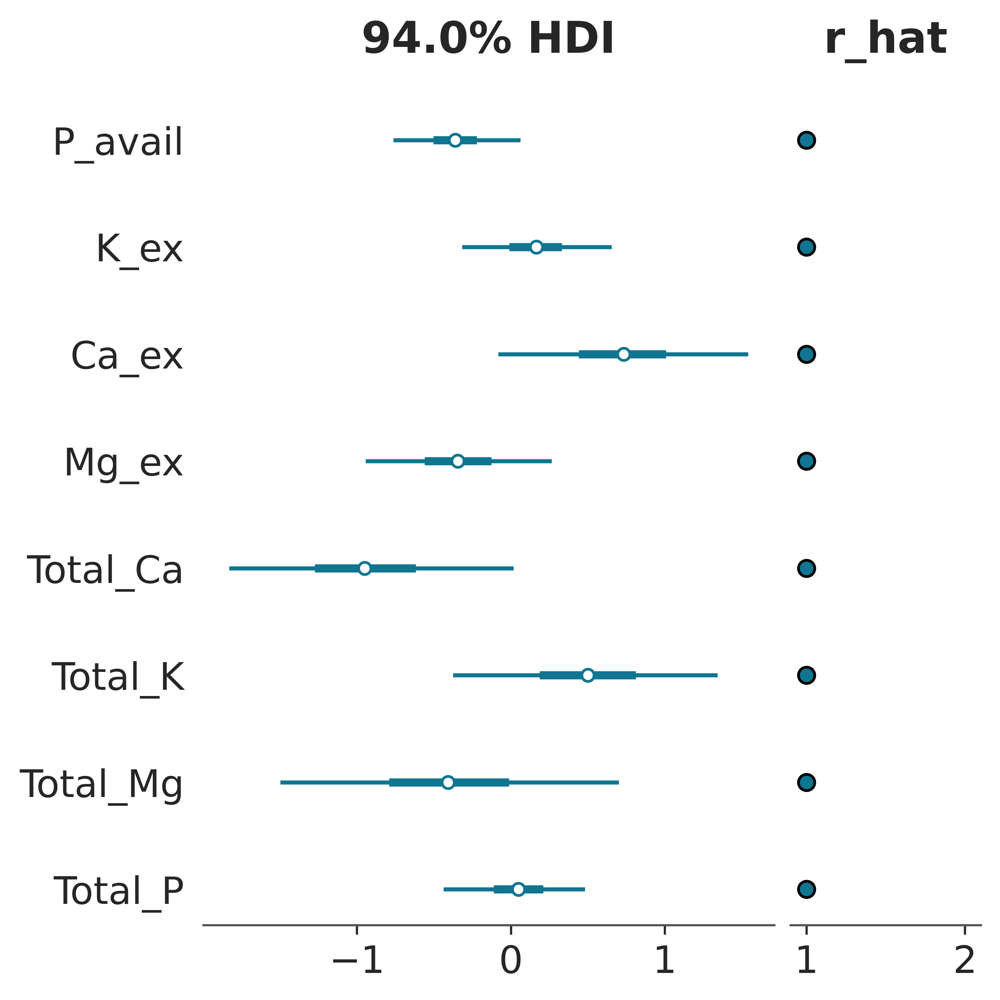

In [38]:
az.plot_forest(fitted_all2,var_names=['P_avail', 'K_ex', 'Ca_ex', 'Mg_ex', 
       'Total_Ca', 'Total_K', 'Total_Mg', 'Total_P'], combined=True, figsize=(5,5),r_hat=True);

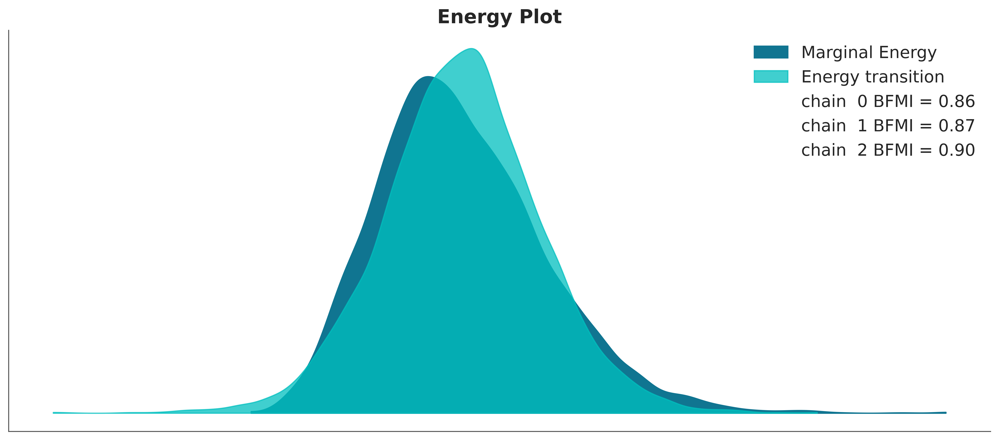

In [40]:

import matplotlib.pyplot as plt

import arviz as az

az.style.use("arviz-doc")

ax = az.plot_energy(fitted_all2, fill_color=("C0", "C1"))

ax.set_title("Energy Plot")

plt.show()

In [41]:
posterior_predictive = model_all2.predict(fitted_all2, kind="pps")
fitted_all2

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

In [ ]:

import matplotlib.pyplot as plt

import arviz as az

az.style.use("arviz-doc")

az.plot_ppc(fitted_all2, alpha=0.03, textsize=14)

plt.show()

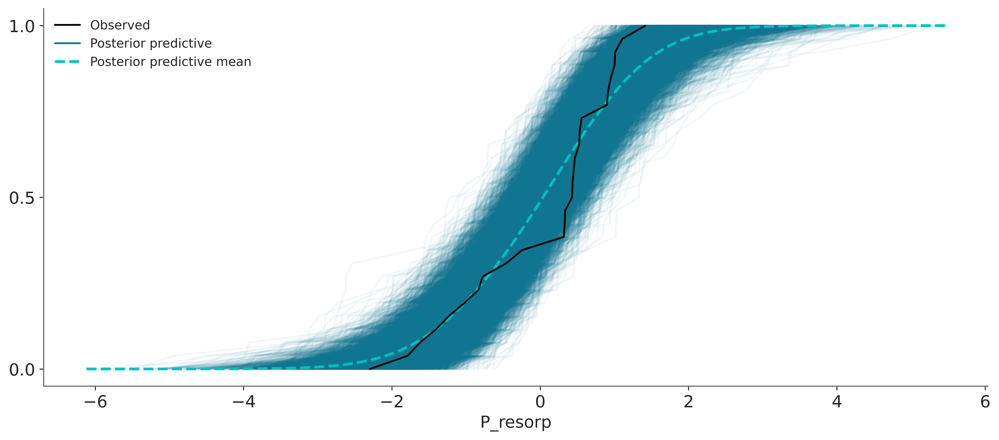

In [43]:
import arviz as az

az.style.use("arviz-doc")

az.plot_ppc(fitted_all2, alpha=0.05, kind="cumulative", textsize=14)

plt.show()

In [54]:
import xarray as xr
fitted_all2.posterior["y_model"] = (fitted_all2.posterior["Intercept"] + fitted_all2.posterior["Ca_ex"] * xr.DataArray(cov_trans.Ca_ex)+fitted_all2.posterior["K_ex"] * xr.DataArray(cov_trans.K_ex)+
                                    fitted_all2.posterior["Mg_ex"] * xr.DataArray(cov_trans.Mg_ex)+fitted_all2.posterior["Total_Ca"] * xr.DataArray(cov_trans.Total_Ca)+
                                    )


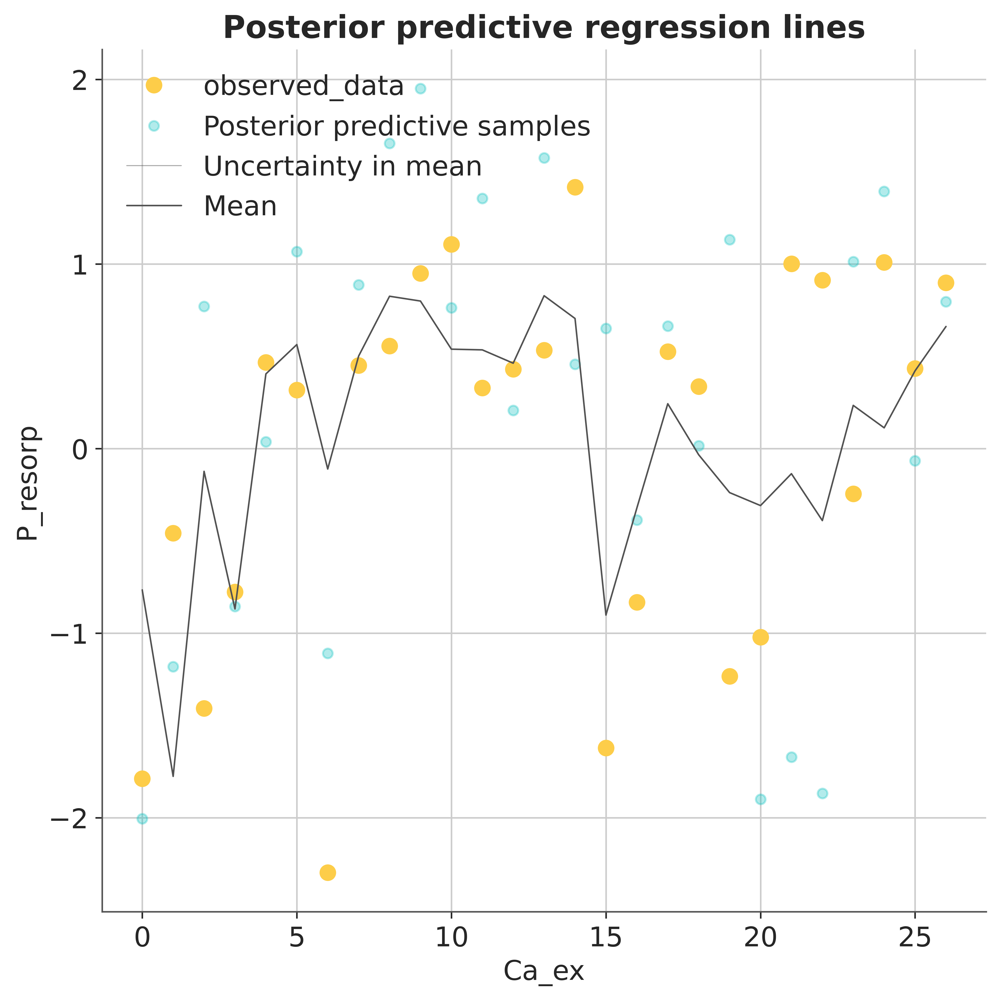

In [57]:
_, ax = plt.subplots(figsize=(7, 7))
az.plot_lm(idata=fitted_all2, y="P_resorp", num_samples=1, axes=ax, y_model="y_model")
ax.set_title("Posterior predictive regression lines")
ax.set_xlabel("Ca_ex");

In [61]:
fitted_all2.posterior.P_resorp_mean[0]

<xarray.DataArray 'P_resorp_mean' (draw: 3000, P_resorp_obs: 27)> Size: 648kB
array([[-1.13257296, -0.977389  , -0.27454754, ...,  0.08454684,
         0.1248602 ,  0.65496156],
       [-1.35140175, -1.61551932, -1.31365141, ...,  0.06087436,
         0.18889588,  0.85534946],
       [-1.2118741 , -0.54329207, -0.39016992, ...,  0.04633342,
        -0.54395046,  0.51872456],
       ...,
       [-1.26319435, -0.78016983,  0.11260886, ...,  0.4540232 ,
        -0.01023392,  0.24060504],
       [-0.48850168, -1.85868356, -1.87253787, ...,  0.41395612,
         0.21172017,  0.50231757],
       [-1.73875987, -1.73231248, -1.91352522, ...,  0.07298583,
        -0.14246643,  0.4963175 ]])
Coordinates:
    chain         int32 4B 0
  * draw          (draw) int32 12kB 0 1 2 3 4 5 ... 2995 2996 2997 2998 2999
  * P_resorp_obs  (P_resorp_obs) int32 108B 0 1 2 3 4 5 6 ... 21 22 23 24 25 26